<a href="https://colab.research.google.com/github/harikrishnareddymallavarapu/schoolofai/blob/master/Assignment3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Loading the required libraries

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
from os import listdir
import matplotlib.pyplot as plt
from torch import optim
from tqdm import tqdm
from torch.utils.data import Dataset
import matplotlib.pyplot as plt
from matplotlib import style

style.use("ggplot")

### Checking for GPU device


In [2]:
if torch.cuda.is_available():
    device = torch.device("cuda:0")  # you can continue going on here, like cuda:1 cuda:2....etc. 
    print("Running on the GPU")
else:
    device = torch.device("cpu")
    print("Running on the CPU")

Running on the GPU


## Downloading the MNIST dataset to the root directory and transforming the images to Tensors

In [3]:
%%capture
dataset = torchvision.datasets.MNIST(
    root='./data'
    ,train=True
    ,download=True
    ,transform=transforms.Compose([
        transforms.ToTensor()
    ])
)

#splitting the data to test and train
train_set, val_set = torch.utils.data.random_split(dataset, [50000, 10000])

### Understanding the dataset
Here the shape of the image is 1x28x28 3D tensor and label is a 1D tensor

In [4]:
# Using the DataLoader to sample the data
train_loader = torch.utils.data.DataLoader(train_set
    ,batch_size=32
    ,shuffle=True
)

In [5]:
dataIter = iter(train_loader)
image, labels = dataIter.next()
print(image.shape)
print(labels.shape)

torch.Size([32, 1, 28, 28])
torch.Size([32])


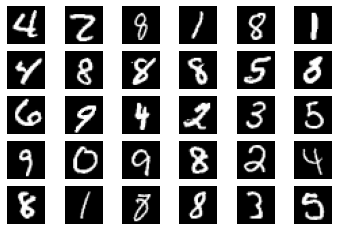

In [6]:
# Plotting some samplepoints from dataset 
figure = plt.figure()
num_of_images = 30
for index in range(1, num_of_images + 1):
    plt.subplot(5, 6, index)
    plt.axis('off')
    plt.imshow(image[index].numpy().squeeze(), cmap='gray')

## Creating Custom dataset to include random numbers and generate labels which is sum of the random number and the image label

Here we have 2 inputs, the first one is a image matrix and the second input is a random number. The random number in the range of (0,9) is generated using the torch.randint method and its converted to one-hot vector representation

The desired output is to get the image label as one output and the other output is to get the sum of the random number and the image label. Output2 is converted to one-hot representation as we know from the problem that the min and max values would be in the range 0 to 18


In [7]:
class MNISTAndRandomBinaryNumbers(Dataset):
  
  def __init__(self, mnistDataset):
    self.data = []

    #load the dataset
    #calculate the length dataset
    lengthOfDataset = len(mnistDataset)
    #calculate the shape of the dataset
    #Create a new list of random numbers
    randomNumbers = torch.randint(0,9,(lengthOfDataset,))
    #append the new label to the dataset
    #add the number to the label of the dataset to create sum output
    #create a vector representation of the sum output
    #append the sum vector and sum value as new dimensions to the dataset
    for i in range(lengthOfDataset):
      test = list(mnistDataset[i])
      test.append(self.getOneHotRepresentation(0,9,randomNumbers[i]))
      #test.append(self.getOneHotRepresentation(0,18,test[1]+randomNumbers[i]))
      test.append((torch.Tensor([test[1]+randomNumbers[i]])).type(torch.LongTensor))
      self.data.append(tuple(test))

  #returns a value fromt he dataset as a tuple based on the index provided
  def __getitem__(self, index):
    return self.data[index]

  #returns the length of the dataset
  def __len__(self):
    return len(self.data)

  #this function generates the one hot representations based on the min and max values
  def getOneHotRepresentation(self, lowValue,highValue, repValue):
    onehotRep = torch.zeros(highValue-lowValue+1)
    if (repValue<= highValue) & (repValue>= lowValue): 
      onehotRep[repValue-lowValue] =1
    return onehotRep

## Problem
Write a neural network that can:

Take 2 inputs:
 * an image from MNIST dataset, and
 * a random number between 0 and 9

Gives two outputs:
 * the "number" that was represented by the MNIST image, and
 * the "sum" of this number with the random number that was generated and sent as the input to the network
------------------------------------------------------------------------------------------------
## Approach

**Creation of Custom Dataset to include image labels and random numbers**
1. MNIST from torch datastes is downlaoded and splitted to train and test sets
```
  train_set, val_set = torch.utils.data.random_split(dataset, [50000, 10000])
```
2. Custom Data class is created to generate the data required for the problem. The __getitem__() and __len__() functions are implemented in the class. Each record in the MNIST dataset is appened with random number and sum of the label and the random number is considered as the output label 

Below code clip shows how the random numbers and MNIST dataset are appeneded in the class

```
class MNISTAndRandomBinaryNumbers(Dataset):
  
  def __init__(self, mnistDataset):
    self.data = []

    lengthOfDataset = len(mnistDataset)
    randomNumbers = torch.randint(0,9,(lengthOfDataset,))
    for i in range(lengthOfDataset):
      test = list(mnistDataset[i])
      test.append(self.getOneHotRepresentation(0,9,randomNumbers[i]))
      #test.append(self.getOneHotRepresentation(0,18,test[1]+randomNumbers[i]))
      test.append((torch.Tensor([test[1]+randomNumbers[i]])).type(torch.LongTensor))
      self.data.append(tuple(test))```
```

when we access the class we get 4 values, the first one is a image matrix and the second input is a one hot represented random number. The random number in the range of (0,9) is generated using the torch.randint method and its converted to one-hot vector representation. The other 2 are labels related to image class and random number 

**Neural Network**
## Building the Neural Network Model
The Model takes 2 inputs and generates 2 outputs

Below are the steps on how the network processes the data in different layers

In this design we pass the first input in layer1 and the second input is appended in the layer 3. We could pass in layer 1 but in this design its chosen to pass in layer 3. The convolution layers are generally used for averaging out the impact from neigbourhood pixels which best suits for images so we chose to pass the random number from layer 3 

### Layer 1
1. The first input which is an image of 1x28x28 is passed through a convolution layer with a kernelsize = 5 and out channels as 6. The output of this layer is 6 outputs / features of the size 1x24x24. 
2. The first layer output is passed Relu activation and through Max pooling layer of kernel size 2 and stride 2. Each feature 1x24x24 is max pooled to 1x12x12 size

### Layer 2 
3. The output of the layer 1 is taken as input to second convolution layer which has a kernel size of 5 and out channels as 12. The 6 input tensors of size 1x12x12 is converted to 12 features of size 1x8x8.
4. The output of the second layer convolution operation is passed to a Relu activation and to a max pool layer with kernel 2 and stride 2. Each feature of 1x12x12 is max pooled to size 1x4x4

### Layer 3.a
5. The second input is passed as input to this layer. This layer takes 1x10 as input and generates 1xsizeDefinedByuser (passed as parameter to the model, here it is 30) as the output
6. This output is passed through a Relu activation layer

### Layer 3.b 
7. The 12 features from output of layer 2 is flattened to [1, 192] tensor and the second input is concatenated to this output. This concatenated tensor acts as input to layer 3
8.The layer 3 takes 1x222 vector as input and generates 120 features as output
9. weighted input of layer 3.b neurons are passed through relu activation function

### Layer 4
10. The layer 3 takes 1x120 vector as input and generates 1x60 features as output
11. The weighted input of layer 4 neurons are passed through relu activation function

### Layer 5
12. The layer 4 takes 1x60 vector as input and generates 1x45 features as output
13. The weighted input of layer 5 neurons are passed through relu activation function

### Layer 6 - Output 1
14. The layer 5 takes 1x45 vector as input and generates 1x10 features as output
15. The output of the layer 6 is passed through softmax function to generate the probabilites of the class 

### Layer 7 - Output 2
16. The layer 5 takes 1x45 vector as input and generates 1x19 features as output
17. The output of the layer 7 is passed through softmax function to generate the probabilites of the class 


In [8]:
batchSize = 32
dataset = MNISTAndRandomBinaryNumbers(train_set)
train_loader = torch.utils.data.DataLoader(dataset
    ,batch_size=batchSize 
    ,shuffle=True
)

In [72]:
class NetworkModel(nn.Module):

  def __init__(self, randomVectorSize):
    super(NetworkModel,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1, out_channels=6, kernel_size=5) #28x28 image is convoluted to 6 feature maps of size 24x24 and after max pooling it has size 12x12
    self.conv2 = nn.Conv2d(in_channels=6, out_channels=12, kernel_size=5) #12x12 image is convoluted to 12 feature maps of size 8x8 and after max pooling the size is 4x4
    self.fc0 = nn.Linear(in_features=10, out_features=randomVectorSize)
    self.fc1 = nn.Linear(in_features=(12 * 4 * 4)+randomVectorSize, out_features=120)
    self.fc2 = nn.Linear(in_features=120, out_features=60)
    self.fc3 = nn.Linear(in_features=60, out_features=45)
    self.out1 = nn.Linear(in_features=45, out_features=10)
    self.out2 = nn.Linear(in_features=45, out_features=19)

  def forward(self,x,y):
    shapeTracker =[]
    shapeTracker.append(x.shape)

    #input layer
    x=x
    y=y

    #Convolution Layer 1
    x = self.conv1(x)
    x = F.relu(x)
    x = F.max_pool2d(x, kernel_size=2, stride=2)
    shapeTracker.append(x.shape)

    #Convolution Layer 2
    x = self.conv2(x)
    x = F.relu(x)
    x = F.max_pool2d(x, kernel_size=2, stride=2)
    shapeTracker.append(x.shape)

    #Linear Layer 0
    y = y.reshape(-1,10)
    y = self.fc0(y)
    y = F.relu(y)

    #Linear Layer 1
    x = x.reshape(-1, 12 * 4 * 4)
    #y = y.reshape(-1,10)
    #x = x.reshape(-1) 
    #x = x / x.sum(0).expand_as(x) #normalizing the vectors before concatenating
    #x = x.reshape(-1,12 * 4 * 4)
    x = torch.cat((x,y),dim=1)
    x = self.fc1(x)
    x = F.relu(x)
    shapeTracker.append(x.shape)
    
    #Linear Layer 2
    x = self.fc2(x)
    x = F.relu(x)
    shapeTracker.append(x.shape)

    #Linear Layer 3
    x = self.fc3(x)
    x = F.relu(x)
    shapeTracker.append(x.shape)
    
    #Output Layer - Output 1
    out1 = self.out1(x)
    out1 = F.softmax(out1, dim=1)

    #Output Layer - Output 2
    out2 = self.out2(x)
    out2 = F.softmax(out2, dim=1)

    return out1, out2


In [77]:
network = NetworkModel(30)
network.to(device)
print(network)

NetworkModel(
  (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(6, 12, kernel_size=(5, 5), stride=(1, 1))
  (fc0): Linear(in_features=10, out_features=30, bias=True)
  (fc1): Linear(in_features=222, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=60, bias=True)
  (fc3): Linear(in_features=60, out_features=45, bias=True)
  (out1): Linear(in_features=45, out_features=10, bias=True)
  (out2): Linear(in_features=45, out_features=19, bias=True)
)


# Training the Model

Following are the Hyperparameters that has been used for the training

1. Stochastic Gradient Descent Optimization technique has been used for training the model with learning rate of 0.001 and momentum 0.9

2. Cross entropy loss has been used for calculating the loss for both the outputs as the model generates probability distribution of the classes. Cross entropy generates high loss value when the model deviates from the actual prediction and generates small loss when the prediction is close.

3. The loss generated by both the outputs has been added to create a single loss and this has been used for gradient and back propagations. I have tried different by giving different weights to the losses but there is not much improvement in the model performance

4. Model is trained for 100 epochs. Under each epoch, the model is trained for every batch of 32 records and the weights are updated by calculating the loss at the end of each batch processing.

In [78]:
def get_num_correct(preds, labels):
  #print(preds,labels)
  return preds.argmax(dim=1).eq(labels).sum().item()

In [79]:
#pred, shapes = network(test[0][0].unsqueeze(0),test[0][2])
optimizer = optim.SGD(network.parameters(), lr=0.001, momentum=0.9)
criterion1 = nn.CrossEntropyLoss()
criterion2 = nn.CrossEntropyLoss()
epochs = 100

decrease_loss = []
images_correct = 0
random_sum_correct = 0

for e in tqdm(range(epochs)):
  total_loss = 0
  images_correct = 0
  random_sum_correct = 0
  i=0
  for images, labels,randomNumbers, sumlabels in train_loader:
    i+=1
    optimizer.zero_grad()
    output1,output2 = network(images.to(device),randomNumbers.to(device))

    loss1 = criterion1(output1, labels.to(device))
    loss2 = criterion2(output2,sumlabels.reshape(-1).to(device) )
    loss = loss1 + loss2
    loss.backward() #calculates the gradient
    optimizer.step() #Updating weights

    total_loss += loss.item()
    images_correct += get_num_correct(output1.to(device), labels.to(device))
    random_sum_correct += get_num_correct(output2.to(device), sumlabels.reshape(-1).to(device))#(sumlabels.reshape(batchSize)).type(torch.LongTensor).to(device))

    print(
        "Epoch: ", e, 
        "Iteration: ",i,
        "Loss: ", total_loss,
        "Image Labels Correct: ",images_correct,
        "Random Sum Correct: ",random_sum_correct
    )
  decrease_loss.append(total_loss)




  0%|          | 0/100 [00:00<?, ?it/s]

Epoch:  0 Iteration:  1 Loss:  5.245994567871094 Image Labels Correct:  4 Random Sum Correct:  1
Epoch:  0 Iteration:  2 Loss:  10.4916353225708 Image Labels Correct:  7 Random Sum Correct:  4
Epoch:  0 Iteration:  3 Loss:  15.73952579498291 Image Labels Correct:  13 Random Sum Correct:  8
Epoch:  0 Iteration:  4 Loss:  20.98907470703125 Image Labels Correct:  15 Random Sum Correct:  10
Epoch:  0 Iteration:  5 Loss:  26.238951683044434 Image Labels Correct:  17 Random Sum Correct:  10
Epoch:  0 Iteration:  6 Loss:  31.484360694885254 Image Labels Correct:  23 Random Sum Correct:  12
Epoch:  0 Iteration:  7 Loss:  36.73059320449829 Image Labels Correct:  27 Random Sum Correct:  19
Epoch:  0 Iteration:  8 Loss:  41.97998046875 Image Labels Correct:  28 Random Sum Correct:  22
Epoch:  0 Iteration:  9 Loss:  47.22715377807617 Image Labels Correct:  31 Random Sum Correct:  25
Epoch:  0 Iteration:  10 Loss:  52.47608757019043 Image Labels Correct:  35 Random Sum Correct:  28
Epoch:  0 Iterat




  1%|          | 1/100 [00:10<17:18, 10.49s/it]

Epoch:  0 Iteration:  1549 Loss:  8128.120681762695 Image Labels Correct:  4474 Random Sum Correct:  4230
Epoch:  0 Iteration:  1550 Loss:  8133.367691040039 Image Labels Correct:  4477 Random Sum Correct:  4231
Epoch:  0 Iteration:  1551 Loss:  8138.61479473114 Image Labels Correct:  4479 Random Sum Correct:  4233
Epoch:  0 Iteration:  1552 Loss:  8143.861986160278 Image Labels Correct:  4481 Random Sum Correct:  4234
Epoch:  0 Iteration:  1553 Loss:  8149.10920715332 Image Labels Correct:  4482 Random Sum Correct:  4236
Epoch:  0 Iteration:  1554 Loss:  8154.353974342346 Image Labels Correct:  4487 Random Sum Correct:  4240
Epoch:  0 Iteration:  1555 Loss:  8159.602924346924 Image Labels Correct:  4489 Random Sum Correct:  4241
Epoch:  0 Iteration:  1556 Loss:  8164.848878860474 Image Labels Correct:  4493 Random Sum Correct:  4246
Epoch:  0 Iteration:  1557 Loss:  8170.097514152527 Image Labels Correct:  4497 Random Sum Correct:  4250
Epoch:  0 Iteration:  1558 Loss:  8175.342483520




  2%|▏         | 2/100 [00:20<17:03, 10.44s/it]

Epoch:  1 Iteration:  1539 Loss:  8074.016172885895 Image Labels Correct:  4456 Random Sum Correct:  4214
Epoch:  1 Iteration:  1540 Loss:  8079.262515544891 Image Labels Correct:  4459 Random Sum Correct:  4217
Epoch:  1 Iteration:  1541 Loss:  8084.510791301727 Image Labels Correct:  4459 Random Sum Correct:  4220
Epoch:  1 Iteration:  1542 Loss:  8089.757115364075 Image Labels Correct:  4462 Random Sum Correct:  4220
Epoch:  1 Iteration:  1543 Loss:  8095.00289773941 Image Labels Correct:  4463 Random Sum Correct:  4222
Epoch:  1 Iteration:  1544 Loss:  8100.248784065247 Image Labels Correct:  4463 Random Sum Correct:  4227
Epoch:  1 Iteration:  1545 Loss:  8105.495358467102 Image Labels Correct:  4467 Random Sum Correct:  4232
Epoch:  1 Iteration:  1546 Loss:  8110.737868785858 Image Labels Correct:  4473 Random Sum Correct:  4233
Epoch:  1 Iteration:  1547 Loss:  8115.987536907196 Image Labels Correct:  4474 Random Sum Correct:  4235
Epoch:  1 Iteration:  1548 Loss:  8121.23089933




  3%|▎         | 3/100 [00:31<16:55, 10.46s/it]

Epoch:  2 Iteration:  1551 Loss:  8135.282854557037 Image Labels Correct:  4592 Random Sum Correct:  4238
Epoch:  2 Iteration:  1552 Loss:  8140.529065132141 Image Labels Correct:  4596 Random Sum Correct:  4243
Epoch:  2 Iteration:  1553 Loss:  8145.77392244339 Image Labels Correct:  4599 Random Sum Correct:  4246
Epoch:  2 Iteration:  1554 Loss:  8151.01983499527 Image Labels Correct:  4602 Random Sum Correct:  4248
Epoch:  2 Iteration:  1555 Loss:  8156.261905193329 Image Labels Correct:  4608 Random Sum Correct:  4250
Epoch:  2 Iteration:  1556 Loss:  8161.508363246918 Image Labels Correct:  4611 Random Sum Correct:  4252
Epoch:  2 Iteration:  1557 Loss:  8166.749783039093 Image Labels Correct:  4616 Random Sum Correct:  4255
Epoch:  2 Iteration:  1558 Loss:  8171.994958400726 Image Labels Correct:  4620 Random Sum Correct:  4258
Epoch:  2 Iteration:  1559 Loss:  8177.239883899689 Image Labels Correct:  4623 Random Sum Correct:  4260
Epoch:  2 Iteration:  1560 Loss:  8182.483007907




  4%|▍         | 4/100 [00:41<16:48, 10.51s/it]

Epoch:  3 Iteration:  1560 Loss:  8180.69055891037 Image Labels Correct:  5644 Random Sum Correct:  4261
Epoch:  3 Iteration:  1561 Loss:  8185.934940814972 Image Labels Correct:  5648 Random Sum Correct:  4263
Epoch:  3 Iteration:  1562 Loss:  8191.180106163025 Image Labels Correct:  5652 Random Sum Correct:  4265
Epoch:  3 Iteration:  1563 Loss:  8196.429399490356 Image Labels Correct:  5653 Random Sum Correct:  4266
Epoch:  4 Iteration:  1 Loss:  5.244862079620361 Image Labels Correct:  3 Random Sum Correct:  4
Epoch:  4 Iteration:  2 Loss:  10.484682559967041 Image Labels Correct:  10 Random Sum Correct:  5
Epoch:  4 Iteration:  3 Loss:  15.727388381958008 Image Labels Correct:  13 Random Sum Correct:  6
Epoch:  4 Iteration:  4 Loss:  20.971189975738525 Image Labels Correct:  17 Random Sum Correct:  9
Epoch:  4 Iteration:  5 Loss:  26.21504831314087 Image Labels Correct:  19 Random Sum Correct:  13
Epoch:  4 Iteration:  6 Loss:  31.457168102264404 Image Labels Correct:  23 Random S




  5%|▌         | 5/100 [00:52<16:40, 10.54s/it]

Epoch:  4 Iteration:  1535 Loss:  8047.7456822395325 Image Labels Correct:  5504 Random Sum Correct:  4886
Epoch:  4 Iteration:  1536 Loss:  8052.985685825348 Image Labels Correct:  5510 Random Sum Correct:  4889
Epoch:  4 Iteration:  1537 Loss:  8058.22971868515 Image Labels Correct:  5513 Random Sum Correct:  4893
Epoch:  4 Iteration:  1538 Loss:  8063.474099636078 Image Labels Correct:  5517 Random Sum Correct:  4896
Epoch:  4 Iteration:  1539 Loss:  8068.7138414382935 Image Labels Correct:  5521 Random Sum Correct:  4898
Epoch:  4 Iteration:  1540 Loss:  8073.959179878235 Image Labels Correct:  5524 Random Sum Correct:  4902
Epoch:  4 Iteration:  1541 Loss:  8079.2054080963135 Image Labels Correct:  5525 Random Sum Correct:  4902
Epoch:  4 Iteration:  1542 Loss:  8084.447762966156 Image Labels Correct:  5526 Random Sum Correct:  4903
Epoch:  4 Iteration:  1543 Loss:  8089.688962936401 Image Labels Correct:  5531 Random Sum Correct:  4907
Epoch:  4 Iteration:  1544 Loss:  8094.93533

Epoch:  5 Iteration:  1 Loss:  5.247736930847168 Image Labels Correct:  2 Random Sum Correct:  1
Epoch:  5 Iteration:  2 Loss:  10.487698554992676 Image Labels Correct:  8 Random Sum Correct:  5
Epoch:  5 Iteration:  3 Loss:  15.730439186096191 Image Labels Correct:  10 Random Sum Correct:  9
Epoch:  5 Iteration:  4 Loss:  20.971176624298096 Image Labels Correct:  19 Random Sum Correct:  10
Epoch:  5 Iteration:  5 Loss:  26.213107585906982 Image Labels Correct:  26 Random Sum Correct:  12
Epoch:  5 Iteration:  6 Loss:  31.457889080047607 Image Labels Correct:  28 Random Sum Correct:  16
Epoch:  5 Iteration:  7 Loss:  36.698923110961914 Image Labels Correct:  33 Random Sum Correct:  19
Epoch:  5 Iteration:  8 Loss:  41.9378604888916 Image Labels Correct:  35 Random Sum Correct:  23
Epoch:  5 Iteration:  9 Loss:  47.17858934402466 Image Labels Correct:  38 Random Sum Correct:  25
Epoch:  5 Iteration:  10 Loss:  52.42041063308716 Image Labels Correct:  42 Random Sum Correct:  29
Epoch:  5




  6%|▌         | 6/100 [01:03<16:33, 10.57s/it]

Epoch:  5 Iteration:  1544 Loss:  8092.82722568512 Image Labels Correct:  5542 Random Sum Correct:  5044
Epoch:  5 Iteration:  1545 Loss:  8098.067437171936 Image Labels Correct:  5548 Random Sum Correct:  5044
Epoch:  5 Iteration:  1546 Loss:  8103.31236410141 Image Labels Correct:  5551 Random Sum Correct:  5045
Epoch:  5 Iteration:  1547 Loss:  8108.553313732147 Image Labels Correct:  5558 Random Sum Correct:  5050
Epoch:  5 Iteration:  1548 Loss:  8113.790317058563 Image Labels Correct:  5562 Random Sum Correct:  5054
Epoch:  5 Iteration:  1549 Loss:  8119.034226894379 Image Labels Correct:  5564 Random Sum Correct:  5057
Epoch:  5 Iteration:  1550 Loss:  8124.278301715851 Image Labels Correct:  5566 Random Sum Correct:  5059
Epoch:  5 Iteration:  1551 Loss:  8129.52449464798 Image Labels Correct:  5568 Random Sum Correct:  5061
Epoch:  5 Iteration:  1552 Loss:  8134.767795085907 Image Labels Correct:  5571 Random Sum Correct:  5063
Epoch:  5 Iteration:  1553 Loss:  8140.0070672035




  7%|▋         | 7/100 [01:13<16:24, 10.58s/it]

Epoch:  6 Iteration:  1553 Loss:  8137.603479385376 Image Labels Correct:  5582 Random Sum Correct:  5069
Epoch:  6 Iteration:  1554 Loss:  8142.846857070923 Image Labels Correct:  5587 Random Sum Correct:  5069
Epoch:  6 Iteration:  1555 Loss:  8148.086708068848 Image Labels Correct:  5589 Random Sum Correct:  5072
Epoch:  6 Iteration:  1556 Loss:  8153.320914268494 Image Labels Correct:  5597 Random Sum Correct:  5076
Epoch:  6 Iteration:  1557 Loss:  8158.562628746033 Image Labels Correct:  5600 Random Sum Correct:  5078
Epoch:  6 Iteration:  1558 Loss:  8163.801782608032 Image Labels Correct:  5604 Random Sum Correct:  5082
Epoch:  6 Iteration:  1559 Loss:  8169.043985366821 Image Labels Correct:  5607 Random Sum Correct:  5083
Epoch:  6 Iteration:  1560 Loss:  8174.283360481262 Image Labels Correct:  5610 Random Sum Correct:  5084
Epoch:  6 Iteration:  1561 Loss:  8179.523845672607 Image Labels Correct:  5613 Random Sum Correct:  5090
Epoch:  6 Iteration:  1562 Loss:  8184.7622365




  8%|▊         | 8/100 [01:24<16:16, 10.62s/it]

Epoch:  7 Iteration:  1542 Loss:  8077.12769985199 Image Labels Correct:  5531 Random Sum Correct:  5018
Epoch:  7 Iteration:  1543 Loss:  8082.363094806671 Image Labels Correct:  5535 Random Sum Correct:  5020
Epoch:  7 Iteration:  1544 Loss:  8087.598030567169 Image Labels Correct:  5542 Random Sum Correct:  5023
Epoch:  7 Iteration:  1545 Loss:  8092.835948467255 Image Labels Correct:  5546 Random Sum Correct:  5027
Epoch:  7 Iteration:  1546 Loss:  8098.071321964264 Image Labels Correct:  5550 Random Sum Correct:  5031
Epoch:  7 Iteration:  1547 Loss:  8103.300754070282 Image Labels Correct:  5557 Random Sum Correct:  5035
Epoch:  7 Iteration:  1548 Loss:  8108.53413772583 Image Labels Correct:  5561 Random Sum Correct:  5040
Epoch:  7 Iteration:  1549 Loss:  8113.768292427063 Image Labels Correct:  5566 Random Sum Correct:  5042
Epoch:  7 Iteration:  1550 Loss:  8119.003911018372 Image Labels Correct:  5571 Random Sum Correct:  5046
Epoch:  7 Iteration:  1551 Loss:  8124.233209609




  9%|▉         | 9/100 [01:35<16:11, 10.68s/it]

Epoch:  8 Iteration:  1546 Loss:  8093.981788635254 Image Labels Correct:  5563 Random Sum Correct:  5038
Epoch:  8 Iteration:  1547 Loss:  8099.217494010925 Image Labels Correct:  5565 Random Sum Correct:  5040
Epoch:  8 Iteration:  1548 Loss:  8104.438068389893 Image Labels Correct:  5566 Random Sum Correct:  5048
Epoch:  8 Iteration:  1549 Loss:  8109.663878440857 Image Labels Correct:  5569 Random Sum Correct:  5052
Epoch:  8 Iteration:  1550 Loss:  8114.898973941803 Image Labels Correct:  5572 Random Sum Correct:  5055
Epoch:  8 Iteration:  1551 Loss:  8120.136747837067 Image Labels Correct:  5577 Random Sum Correct:  5056
Epoch:  8 Iteration:  1552 Loss:  8125.366233825684 Image Labels Correct:  5580 Random Sum Correct:  5062
Epoch:  8 Iteration:  1553 Loss:  8130.596163749695 Image Labels Correct:  5585 Random Sum Correct:  5066
Epoch:  8 Iteration:  1554 Loss:  8135.823970794678 Image Labels Correct:  5586 Random Sum Correct:  5071
Epoch:  8 Iteration:  1555 Loss:  8141.0523242




 10%|█         | 10/100 [01:46<16:03, 10.70s/it]

Epoch:  9 Iteration:  1531 Loss:  8006.660412788391 Image Labels Correct:  5789 Random Sum Correct:  4994
Epoch:  9 Iteration:  1532 Loss:  8011.893970012665 Image Labels Correct:  5794 Random Sum Correct:  4995
Epoch:  9 Iteration:  1533 Loss:  8017.120735645294 Image Labels Correct:  5798 Random Sum Correct:  4998
Epoch:  9 Iteration:  1534 Loss:  8022.337008476257 Image Labels Correct:  5806 Random Sum Correct:  5002
Epoch:  9 Iteration:  1535 Loss:  8027.560562133789 Image Labels Correct:  5814 Random Sum Correct:  5004
Epoch:  9 Iteration:  1536 Loss:  8032.777707099915 Image Labels Correct:  5825 Random Sum Correct:  5006
Epoch:  9 Iteration:  1537 Loss:  8038.007526397705 Image Labels Correct:  5833 Random Sum Correct:  5008
Epoch:  9 Iteration:  1538 Loss:  8043.2414355278015 Image Labels Correct:  5838 Random Sum Correct:  5011
Epoch:  9 Iteration:  1539 Loss:  8048.466103076935 Image Labels Correct:  5850 Random Sum Correct:  5014
Epoch:  9 Iteration:  1540 Loss:  8053.690223

Epoch:  10 Iteration:  1 Loss:  5.225210189819336 Image Labels Correct:  8 Random Sum Correct:  3
Epoch:  10 Iteration:  2 Loss:  10.47022533416748 Image Labels Correct:  15 Random Sum Correct:  5
Epoch:  10 Iteration:  3 Loss:  15.676340103149414 Image Labels Correct:  24 Random Sum Correct:  11
Epoch:  10 Iteration:  4 Loss:  20.899221897125244 Image Labels Correct:  31 Random Sum Correct:  15
Epoch:  10 Iteration:  5 Loss:  26.11997652053833 Image Labels Correct:  38 Random Sum Correct:  20
Epoch:  10 Iteration:  6 Loss:  31.33806800842285 Image Labels Correct:  42 Random Sum Correct:  23
Epoch:  10 Iteration:  7 Loss:  36.56590557098389 Image Labels Correct:  47 Random Sum Correct:  25
Epoch:  10 Iteration:  8 Loss:  41.78945970535278 Image Labels Correct:  53 Random Sum Correct:  27
Epoch:  10 Iteration:  9 Loss:  47.00951910018921 Image Labels Correct:  62 Random Sum Correct:  30
Epoch:  10 Iteration:  10 Loss:  52.230297565460205 Image Labels Correct:  72 Random Sum Correct:  33




 11%|█         | 11/100 [01:56<15:53, 10.71s/it]

Epoch:  11 Iteration:  1 Loss:  5.212429046630859 Image Labels Correct:  5 Random Sum Correct:  3
Epoch:  11 Iteration:  2 Loss:  10.31466293334961 Image Labels Correct:  13 Random Sum Correct:  11
Epoch:  11 Iteration:  3 Loss:  15.43830156326294 Image Labels Correct:  19 Random Sum Correct:  15
Epoch:  11 Iteration:  4 Loss:  20.498475074768066 Image Labels Correct:  28 Random Sum Correct:  21
Epoch:  11 Iteration:  5 Loss:  25.572943210601807 Image Labels Correct:  38 Random Sum Correct:  26
Epoch:  11 Iteration:  6 Loss:  30.72023296356201 Image Labels Correct:  47 Random Sum Correct:  31
Epoch:  11 Iteration:  7 Loss:  35.86112308502197 Image Labels Correct:  54 Random Sum Correct:  34
Epoch:  11 Iteration:  8 Loss:  41.013145446777344 Image Labels Correct:  61 Random Sum Correct:  35
Epoch:  11 Iteration:  9 Loss:  46.09922742843628 Image Labels Correct:  70 Random Sum Correct:  39
Epoch:  11 Iteration:  10 Loss:  51.24093055725098 Image Labels Correct:  77 Random Sum Correct:  4




 12%|█▏        | 12/100 [02:07<15:42, 10.72s/it]

Epoch:  11 Iteration:  1558 Loss:  7835.210897445679 Image Labels Correct:  17491 Random Sum Correct:  5200
Epoch:  11 Iteration:  1559 Loss:  7840.121647834778 Image Labels Correct:  17507 Random Sum Correct:  5203
Epoch:  11 Iteration:  1560 Loss:  7844.99884557724 Image Labels Correct:  17523 Random Sum Correct:  5207
Epoch:  11 Iteration:  1561 Loss:  7850.0935344696045 Image Labels Correct:  17533 Random Sum Correct:  5208
Epoch:  11 Iteration:  1562 Loss:  7855.19073009491 Image Labels Correct:  17543 Random Sum Correct:  5209
Epoch:  11 Iteration:  1563 Loss:  7859.710270404816 Image Labels Correct:  17556 Random Sum Correct:  5212
Epoch:  12 Iteration:  1 Loss:  5.014595031738281 Image Labels Correct:  11 Random Sum Correct:  5
Epoch:  12 Iteration:  2 Loss:  10.046416282653809 Image Labels Correct:  21 Random Sum Correct:  10
Epoch:  12 Iteration:  3 Loss:  14.884495735168457 Image Labels Correct:  37 Random Sum Correct:  16
Epoch:  12 Iteration:  4 Loss:  19.77277183532715 Im




 13%|█▎        | 13/100 [02:18<15:36, 10.76s/it]

Epoch:  12 Iteration:  1538 Loss:  7627.062493801117 Image Labels Correct:  20057 Random Sum Correct:  5289
Epoch:  12 Iteration:  1539 Loss:  7631.869388580322 Image Labels Correct:  20075 Random Sum Correct:  5293
Epoch:  12 Iteration:  1540 Loss:  7636.8911209106445 Image Labels Correct:  20085 Random Sum Correct:  5299
Epoch:  12 Iteration:  1541 Loss:  7641.728009223938 Image Labels Correct:  20102 Random Sum Correct:  5303
Epoch:  12 Iteration:  1542 Loss:  7646.685567378998 Image Labels Correct:  20115 Random Sum Correct:  5306
Epoch:  12 Iteration:  1543 Loss:  7651.5256152153015 Image Labels Correct:  20131 Random Sum Correct:  5313
Epoch:  12 Iteration:  1544 Loss:  7656.363561630249 Image Labels Correct:  20147 Random Sum Correct:  5318
Epoch:  12 Iteration:  1545 Loss:  7661.35293006897 Image Labels Correct:  20158 Random Sum Correct:  5320
Epoch:  12 Iteration:  1546 Loss:  7666.167091846466 Image Labels Correct:  20173 Random Sum Correct:  5325
Epoch:  12 Iteration:  1547




 14%|█▍        | 14/100 [02:29<15:27, 10.78s/it]

Epoch:  13 Iteration:  1547 Loss:  7552.614223957062 Image Labels Correct:  24072 Random Sum Correct:  5420
Epoch:  13 Iteration:  1548 Loss:  7557.399942398071 Image Labels Correct:  24092 Random Sum Correct:  5423
Epoch:  13 Iteration:  1549 Loss:  7562.30246257782 Image Labels Correct:  24106 Random Sum Correct:  5428
Epoch:  13 Iteration:  1550 Loss:  7567.165410995483 Image Labels Correct:  24121 Random Sum Correct:  5432
Epoch:  13 Iteration:  1551 Loss:  7571.905674934387 Image Labels Correct:  24140 Random Sum Correct:  5437
Epoch:  13 Iteration:  1552 Loss:  7576.8121728897095 Image Labels Correct:  24156 Random Sum Correct:  5439
Epoch:  13 Iteration:  1553 Loss:  7581.766179084778 Image Labels Correct:  24171 Random Sum Correct:  5439
Epoch:  13 Iteration:  1554 Loss:  7586.50293636322 Image Labels Correct:  24190 Random Sum Correct:  5445
Epoch:  13 Iteration:  1555 Loss:  7591.491944313049 Image Labels Correct:  24201 Random Sum Correct:  5446
Epoch:  13 Iteration:  1556 L




 15%|█▌        | 15/100 [02:40<15:17, 10.80s/it]

Epoch:  14 Iteration:  1546 Loss:  7460.548148155212 Image Labels Correct:  26808 Random Sum Correct:  5474
Epoch:  14 Iteration:  1547 Loss:  7465.343054294586 Image Labels Correct:  26828 Random Sum Correct:  5476
Epoch:  14 Iteration:  1548 Loss:  7470.341141700745 Image Labels Correct:  26840 Random Sum Correct:  5478
Epoch:  14 Iteration:  1549 Loss:  7475.091734409332 Image Labels Correct:  26861 Random Sum Correct:  5482
Epoch:  14 Iteration:  1550 Loss:  7479.96012878418 Image Labels Correct:  26878 Random Sum Correct:  5484
Epoch:  14 Iteration:  1551 Loss:  7484.779903411865 Image Labels Correct:  26896 Random Sum Correct:  5487
Epoch:  14 Iteration:  1552 Loss:  7489.536152839661 Image Labels Correct:  26915 Random Sum Correct:  5489
Epoch:  14 Iteration:  1553 Loss:  7494.544850349426 Image Labels Correct:  26926 Random Sum Correct:  5493
Epoch:  14 Iteration:  1554 Loss:  7499.449337482452 Image Labels Correct:  26939 Random Sum Correct:  5498
Epoch:  14 Iteration:  1555 L




 16%|█▌        | 16/100 [02:51<15:12, 10.87s/it]

Epoch:  15 Iteration:  1554 Loss:  7465.134214401245 Image Labels Correct:  27826 Random Sum Correct:  5539
Epoch:  15 Iteration:  1555 Loss:  7470.053036212921 Image Labels Correct:  27840 Random Sum Correct:  5541
Epoch:  15 Iteration:  1556 Loss:  7474.898145198822 Image Labels Correct:  27856 Random Sum Correct:  5544
Epoch:  15 Iteration:  1557 Loss:  7479.859231472015 Image Labels Correct:  27869 Random Sum Correct:  5548
Epoch:  15 Iteration:  1558 Loss:  7484.793127536774 Image Labels Correct:  27883 Random Sum Correct:  5549
Epoch:  15 Iteration:  1559 Loss:  7489.607285499573 Image Labels Correct:  27903 Random Sum Correct:  5550
Epoch:  15 Iteration:  1560 Loss:  7494.52686214447 Image Labels Correct:  27916 Random Sum Correct:  5554
Epoch:  15 Iteration:  1561 Loss:  7499.2821798324585 Image Labels Correct:  27937 Random Sum Correct:  5556
Epoch:  15 Iteration:  1562 Loss:  7504.100907325745 Image Labels Correct:  27953 Random Sum Correct:  5561
Epoch:  15 Iteration:  1563 




 17%|█▋        | 17/100 [03:02<15:03, 10.88s/it]

Epoch:  16 Iteration:  1553 Loss:  7445.962095737457 Image Labels Correct:  28159 Random Sum Correct:  5548
Epoch:  16 Iteration:  1554 Loss:  7450.805259227753 Image Labels Correct:  28177 Random Sum Correct:  5550
Epoch:  16 Iteration:  1555 Loss:  7455.548263549805 Image Labels Correct:  28198 Random Sum Correct:  5552
Epoch:  16 Iteration:  1556 Loss:  7460.444192409515 Image Labels Correct:  28215 Random Sum Correct:  5553
Epoch:  16 Iteration:  1557 Loss:  7465.1935176849365 Image Labels Correct:  28234 Random Sum Correct:  5556
Epoch:  16 Iteration:  1558 Loss:  7469.8220500946045 Image Labels Correct:  28257 Random Sum Correct:  5558
Epoch:  16 Iteration:  1559 Loss:  7474.618035316467 Image Labels Correct:  28275 Random Sum Correct:  5561
Epoch:  16 Iteration:  1560 Loss:  7479.317092418671 Image Labels Correct:  28295 Random Sum Correct:  5567
Epoch:  16 Iteration:  1561 Loss:  7484.094735145569 Image Labels Correct:  28312 Random Sum Correct:  5573
Epoch:  16 Iteration:  156




 18%|█▊        | 18/100 [03:12<14:51, 10.87s/it]

Epoch:  17 Iteration:  1554 Loss:  7438.434929847717 Image Labels Correct:  28464 Random Sum Correct:  5469
Epoch:  17 Iteration:  1555 Loss:  7443.13180065155 Image Labels Correct:  28484 Random Sum Correct:  5474
Epoch:  17 Iteration:  1556 Loss:  7447.971420764923 Image Labels Correct:  28500 Random Sum Correct:  5477
Epoch:  17 Iteration:  1557 Loss:  7452.8258991241455 Image Labels Correct:  28516 Random Sum Correct:  5481
Epoch:  17 Iteration:  1558 Loss:  7457.649067878723 Image Labels Correct:  28533 Random Sum Correct:  5484
Epoch:  17 Iteration:  1559 Loss:  7462.532359600067 Image Labels Correct:  28549 Random Sum Correct:  5489
Epoch:  17 Iteration:  1560 Loss:  7467.31042432785 Image Labels Correct:  28571 Random Sum Correct:  5490
Epoch:  17 Iteration:  1561 Loss:  7472.174518108368 Image Labels Correct:  28586 Random Sum Correct:  5494
Epoch:  17 Iteration:  1562 Loss:  7476.90864944458 Image Labels Correct:  28605 Random Sum Correct:  5500
Epoch:  17 Iteration:  1563 Lo




 19%|█▉        | 19/100 [03:23<14:40, 10.87s/it]

Epoch:  18 Iteration:  1554 Loss:  7430.757760047913 Image Labels Correct:  28662 Random Sum Correct:  5546
Epoch:  18 Iteration:  1555 Loss:  7435.545651912689 Image Labels Correct:  28681 Random Sum Correct:  5547
Epoch:  18 Iteration:  1556 Loss:  7440.346952915192 Image Labels Correct:  28701 Random Sum Correct:  5549
Epoch:  18 Iteration:  1557 Loss:  7445.194059848785 Image Labels Correct:  28718 Random Sum Correct:  5552
Epoch:  18 Iteration:  1558 Loss:  7450.190598964691 Image Labels Correct:  28730 Random Sum Correct:  5555
Epoch:  18 Iteration:  1559 Loss:  7454.98845911026 Image Labels Correct:  28748 Random Sum Correct:  5560
Epoch:  18 Iteration:  1560 Loss:  7459.609447956085 Image Labels Correct:  28772 Random Sum Correct:  5563
Epoch:  18 Iteration:  1561 Loss:  7464.265030384064 Image Labels Correct:  28795 Random Sum Correct:  5565
Epoch:  18 Iteration:  1562 Loss:  7469.116929531097 Image Labels Correct:  28810 Random Sum Correct:  5568
Epoch:  18 Iteration:  1563 L




 20%|██        | 20/100 [03:34<14:29, 10.87s/it]

Epoch:  19 Iteration:  1548 Loss:  7395.993432998657 Image Labels Correct:  28690 Random Sum Correct:  5512
Epoch:  19 Iteration:  1549 Loss:  7400.785853862762 Image Labels Correct:  28708 Random Sum Correct:  5514
Epoch:  19 Iteration:  1550 Loss:  7405.606301784515 Image Labels Correct:  28724 Random Sum Correct:  5518
Epoch:  19 Iteration:  1551 Loss:  7410.43735742569 Image Labels Correct:  28740 Random Sum Correct:  5522
Epoch:  19 Iteration:  1552 Loss:  7415.189684867859 Image Labels Correct:  28760 Random Sum Correct:  5525
Epoch:  19 Iteration:  1553 Loss:  7419.935120582581 Image Labels Correct:  28780 Random Sum Correct:  5529
Epoch:  19 Iteration:  1554 Loss:  7424.87387752533 Image Labels Correct:  28795 Random Sum Correct:  5532
Epoch:  19 Iteration:  1555 Loss:  7429.570191383362 Image Labels Correct:  28816 Random Sum Correct:  5537
Epoch:  19 Iteration:  1556 Loss:  7434.366044998169 Image Labels Correct:  28833 Random Sum Correct:  5542
Epoch:  19 Iteration:  1557 Lo




 21%|██        | 21/100 [03:45<14:17, 10.86s/it]

 7365.439399242401 Image Labels Correct:  29193 Random Sum Correct:  5554
Epoch:  20 Iteration:  1546 Loss:  7370.10364818573 Image Labels Correct:  29215 Random Sum Correct:  5559
Epoch:  20 Iteration:  1547 Loss:  7374.873821735382 Image Labels Correct:  29234 Random Sum Correct:  5562
Epoch:  20 Iteration:  1548 Loss:  7379.779932975769 Image Labels Correct:  29249 Random Sum Correct:  5566
Epoch:  20 Iteration:  1549 Loss:  7384.538787841797 Image Labels Correct:  29270 Random Sum Correct:  5570
Epoch:  20 Iteration:  1550 Loss:  7389.2335748672485 Image Labels Correct:  29292 Random Sum Correct:  5573
Epoch:  20 Iteration:  1551 Loss:  7394.021105766296 Image Labels Correct:  29310 Random Sum Correct:  5577
Epoch:  20 Iteration:  1552 Loss:  7398.788946628571 Image Labels Correct:  29329 Random Sum Correct:  5582
Epoch:  20 Iteration:  1553 Loss:  7403.513163089752 Image Labels Correct:  29350 Random Sum Correct:  5584
Epoch:  20 Iteration:  1554 Loss:  7408.183807849884 Image Lab

Epoch:  21 Iteration:  1532 Loss:  7192.83104467392 Image Labels Correct:  32831 Random Sum Correct:  5563
Epoch:  21 Iteration:  1533 Loss:  7197.4312353134155 Image Labels Correct:  32856 Random Sum Correct:  5566
Epoch:  21 Iteration:  1534 Loss:  7201.949508666992 Image Labels Correct:  32884 Random Sum Correct:  5570
Epoch:  21 Iteration:  1535 Loss:  7206.818204879761 Image Labels Correct:  32901 Random Sum Correct:  5572
Epoch:  21 Iteration:  1536 Loss:  7211.5034012794495 Image Labels Correct:  32922 Random Sum Correct:  5575
Epoch:  21 Iteration:  1537 Loss:  7216.135717391968 Image Labels Correct:  32945 Random Sum Correct:  5579
Epoch:  21 Iteration:  1538 Loss:  7220.744296073914 Image Labels Correct:  32969 Random Sum Correct:  5583
Epoch:  21 Iteration:  1539 Loss:  7225.308439731598 Image Labels Correct:  32994 Random Sum Correct:  5587
Epoch:  21 Iteration:  1540 Loss:  7230.086909294128 Image Labels Correct:  33015 Random Sum Correct:  5588
Epoch:  21 Iteration:  1541

 22%|██▏       | 22/100 [03:56<14:06, 10.86s/it]

Epoch:  22 Iteration:  1 Loss:  4.692978858947754 Image Labels Correct:  23 Random Sum Correct:  3
Epoch:  22 Iteration:  2 Loss:  9.455490589141846 Image Labels Correct:  42 Random Sum Correct:  6
Epoch:  22 Iteration:  3 Loss:  14.222889423370361 Image Labels Correct:  63 Random Sum Correct:  6
Epoch:  22 Iteration:  4 Loss:  18.915696144104004 Image Labels Correct:  84 Random Sum Correct:  11
Epoch:  22 Iteration:  5 Loss:  23.665050983428955 Image Labels Correct:  105 Random Sum Correct:  12
Epoch:  22 Iteration:  6 Loss:  28.37956666946411 Image Labels Correct:  127 Random Sum Correct:  15
Epoch:  22 Iteration:  7 Loss:  33.01303958892822 Image Labels Correct:  149 Random Sum Correct:  21
Epoch:  22 Iteration:  8 Loss:  37.798816204071045 Image Labels Correct:  166 Random Sum Correct:  25
Epoch:  22 Iteration:  9 Loss:  42.55096101760864 Image Labels Correct:  186 Random Sum Correct:  29
Epoch:  22 Iteration:  10 Loss:  47.34083127975464 Image Labels Correct:  206 Random Sum Corre




 23%|██▎       | 23/100 [04:07<13:56, 10.86s/it]

 1562 Loss:  7310.382651805878 Image Labels Correct:  34128 Random Sum Correct:  5597
Epoch:  22 Iteration:  1563 Loss:  7315.121176242828 Image Labels Correct:  34139 Random Sum Correct:  5597
Epoch:  23 Iteration:  1 Loss:  4.645919322967529 Image Labels Correct:  25 Random Sum Correct:  4
Epoch:  23 Iteration:  2 Loss:  9.281742572784424 Image Labels Correct:  48 Random Sum Correct:  7
Epoch:  23 Iteration:  3 Loss:  13.85146951675415 Image Labels Correct:  73 Random Sum Correct:  11
Epoch:  23 Iteration:  4 Loss:  18.555739402770996 Image Labels Correct:  94 Random Sum Correct:  13
Epoch:  23 Iteration:  5 Loss:  23.225627899169922 Image Labels Correct:  118 Random Sum Correct:  15
Epoch:  23 Iteration:  6 Loss:  27.855429649353027 Image Labels Correct:  142 Random Sum Correct:  19
Epoch:  23 Iteration:  7 Loss:  32.506808280944824 Image Labels Correct:  165 Random Sum Correct:  23
Epoch:  23 Iteration:  8 Loss:  37.06915092468262 Image Labels Correct:  191 Random Sum Correct:  27





 24%|██▍       | 24/100 [04:18<13:47, 10.89s/it]

Epoch:  23 Iteration:  1552 Loss:  7170.007067680359 Image Labels Correct:  37188 Random Sum Correct:  5536
Epoch:  23 Iteration:  1553 Loss:  7174.605920314789 Image Labels Correct:  37213 Random Sum Correct:  5539
Epoch:  23 Iteration:  1554 Loss:  7179.114452838898 Image Labels Correct:  37237 Random Sum Correct:  5550
Epoch:  23 Iteration:  1555 Loss:  7183.7799735069275 Image Labels Correct:  37259 Random Sum Correct:  5555
Epoch:  23 Iteration:  1556 Loss:  7188.197788715363 Image Labels Correct:  37287 Random Sum Correct:  5562
Epoch:  23 Iteration:  1557 Loss:  7192.725301742554 Image Labels Correct:  37313 Random Sum Correct:  5566
Epoch:  23 Iteration:  1558 Loss:  7197.2740869522095 Image Labels Correct:  37339 Random Sum Correct:  5569
Epoch:  23 Iteration:  1559 Loss:  7201.943583488464 Image Labels Correct:  37361 Random Sum Correct:  5575
Epoch:  23 Iteration:  1560 Loss:  7206.446305274963 Image Labels Correct:  37389 Random Sum Correct:  5579
Epoch:  23 Iteration:  156




 25%|██▌       | 25/100 [04:29<13:41, 10.95s/it]

Epoch:  24 Iteration:  1550 Loss:  7139.919162273407 Image Labels Correct:  37659 Random Sum Correct:  5510
Epoch:  24 Iteration:  1551 Loss:  7144.4111070632935 Image Labels Correct:  37687 Random Sum Correct:  5512
Epoch:  24 Iteration:  1552 Loss:  7148.952711105347 Image Labels Correct:  37712 Random Sum Correct:  5517
Epoch:  24 Iteration:  1553 Loss:  7153.602713108063 Image Labels Correct:  37735 Random Sum Correct:  5520
Epoch:  24 Iteration:  1554 Loss:  7158.244251728058 Image Labels Correct:  37759 Random Sum Correct:  5523
Epoch:  24 Iteration:  1555 Loss:  7162.629295825958 Image Labels Correct:  37788 Random Sum Correct:  5532
Epoch:  24 Iteration:  1556 Loss:  7167.273694992065 Image Labels Correct:  37810 Random Sum Correct:  5538
Epoch:  24 Iteration:  1557 Loss:  7171.824906826019 Image Labels Correct:  37836 Random Sum Correct:  5541
Epoch:  24 Iteration:  1558 Loss:  7176.319188594818 Image Labels Correct:  37862 Random Sum Correct:  5547
Epoch:  24 Iteration:  1559




 26%|██▌       | 26/100 [04:40<13:28, 10.93s/it]

Epoch:  25 Iteration:  1541 Loss:  7086.885069847107 Image Labels Correct:  37677 Random Sum Correct:  5557
Epoch:  25 Iteration:  1542 Loss:  7091.514657020569 Image Labels Correct:  37701 Random Sum Correct:  5562
Epoch:  25 Iteration:  1543 Loss:  7095.891101360321 Image Labels Correct:  37732 Random Sum Correct:  5566
Epoch:  25 Iteration:  1544 Loss:  7100.507550239563 Image Labels Correct:  37756 Random Sum Correct:  5569
Epoch:  25 Iteration:  1545 Loss:  7105.1292605400085 Image Labels Correct:  37781 Random Sum Correct:  5571
Epoch:  25 Iteration:  1546 Loss:  7109.602125644684 Image Labels Correct:  37809 Random Sum Correct:  5574
Epoch:  25 Iteration:  1547 Loss:  7114.1172432899475 Image Labels Correct:  37836 Random Sum Correct:  5577
Epoch:  25 Iteration:  1548 Loss:  7118.741281986237 Image Labels Correct:  37859 Random Sum Correct:  5581
Epoch:  25 Iteration:  1549 Loss:  7123.448883056641 Image Labels Correct:  37881 Random Sum Correct:  5583
Epoch:  25 Iteration:  155




 27%|██▋       | 27/100 [04:50<13:13, 10.87s/it]

 1550 Loss:  7119.792518615723 Image Labels Correct:  38074 Random Sum Correct:  5651
Epoch:  26 Iteration:  1551 Loss:  7124.481600761414 Image Labels Correct:  38097 Random Sum Correct:  5651
Epoch:  26 Iteration:  1552 Loss:  7129.113516807556 Image Labels Correct:  38122 Random Sum Correct:  5653
Epoch:  26 Iteration:  1553 Loss:  7133.837769031525 Image Labels Correct:  38145 Random Sum Correct:  5654
Epoch:  26 Iteration:  1554 Loss:  7138.443883895874 Image Labels Correct:  38170 Random Sum Correct:  5658
Epoch:  26 Iteration:  1555 Loss:  7143.157199382782 Image Labels Correct:  38191 Random Sum Correct:  5662
Epoch:  26 Iteration:  1556 Loss:  7147.730859279633 Image Labels Correct:  38215 Random Sum Correct:  5668
Epoch:  26 Iteration:  1557 Loss:  7152.236827373505 Image Labels Correct:  38243 Random Sum Correct:  5672
Epoch:  26 Iteration:  1558 Loss:  7156.725426673889 Image Labels Correct:  38270 Random Sum Correct:  5678
Epoch:  26 Iteration:  1559 Loss:  7161.3579769134




 28%|██▊       | 28/100 [05:01<13:04, 10.89s/it]

Epoch:  27 Iteration:  1563 Loss:  7173.594447612762 Image Labels Correct:  38546 Random Sum Correct:  5656
Epoch:  28 Iteration:  1 Loss:  4.560940742492676 Image Labels Correct:  26 Random Sum Correct:  4
Epoch:  28 Iteration:  2 Loss:  9.25697660446167 Image Labels Correct:  49 Random Sum Correct:  4
Epoch:  28 Iteration:  3 Loss:  13.786233901977539 Image Labels Correct:  77 Random Sum Correct:  5
Epoch:  28 Iteration:  4 Loss:  18.278867721557617 Image Labels Correct:  104 Random Sum Correct:  9
Epoch:  28 Iteration:  5 Loss:  22.751729011535645 Image Labels Correct:  132 Random Sum Correct:  12
Epoch:  28 Iteration:  6 Loss:  27.452832221984863 Image Labels Correct:  155 Random Sum Correct:  14
Epoch:  28 Iteration:  7 Loss:  31.940921783447266 Image Labels Correct:  183 Random Sum Correct:  18
Epoch:  28 Iteration:  8 Loss:  36.62959623336792 Image Labels Correct:  203 Random Sum Correct:  24
Epoch:  28 Iteration:  9 Loss:  41.23398971557617 Image Labels Correct:  226 Random Sum




 29%|██▉       | 29/100 [05:12<12:52, 10.88s/it]

Epoch:  28 Iteration:  1559 Loss:  7150.038374900818 Image Labels Correct:  38565 Random Sum Correct:  5682
Epoch:  28 Iteration:  1560 Loss:  7154.665594100952 Image Labels Correct:  38589 Random Sum Correct:  5685
Epoch:  28 Iteration:  1561 Loss:  7159.200390815735 Image Labels Correct:  38614 Random Sum Correct:  5689
Epoch:  28 Iteration:  1562 Loss:  7163.912383079529 Image Labels Correct:  38636 Random Sum Correct:  5690
Epoch:  28 Iteration:  1563 Loss:  7168.612073898315 Image Labels Correct:  38648 Random Sum Correct:  5690
Epoch:  29 Iteration:  1 Loss:  4.564289569854736 Image Labels Correct:  26 Random Sum Correct:  4
Epoch:  29 Iteration:  2 Loss:  9.25510311126709 Image Labels Correct:  50 Random Sum Correct:  4
Epoch:  29 Iteration:  3 Loss:  13.776752471923828 Image Labels Correct:  76 Random Sum Correct:  10
Epoch:  29 Iteration:  4 Loss:  18.37462329864502 Image Labels Correct:  101 Random Sum Correct:  12
Epoch:  29 Iteration:  5 Loss:  22.982797145843506 Image Labe




 30%|███       | 30/100 [05:23<12:41, 10.88s/it]

Epoch:  29 Iteration:  1556 Loss:  7096.676340579987 Image Labels Correct:  39850 Random Sum Correct:  5632
Epoch:  29 Iteration:  1557 Loss:  7101.275611400604 Image Labels Correct:  39875 Random Sum Correct:  5635
Epoch:  29 Iteration:  1558 Loss:  7105.762155532837 Image Labels Correct:  39903 Random Sum Correct:  5637
Epoch:  29 Iteration:  1559 Loss:  7110.354622840881 Image Labels Correct:  39927 Random Sum Correct:  5641
Epoch:  29 Iteration:  1560 Loss:  7114.778144359589 Image Labels Correct:  39957 Random Sum Correct:  5646
Epoch:  29 Iteration:  1561 Loss:  7119.324608802795 Image Labels Correct:  39985 Random Sum Correct:  5647
Epoch:  29 Iteration:  1562 Loss:  7123.873486995697 Image Labels Correct:  40011 Random Sum Correct:  5651
Epoch:  29 Iteration:  1563 Loss:  7128.737250328064 Image Labels Correct:  40019 Random Sum Correct:  5654
Epoch:  30 Iteration:  1 Loss:  4.535109519958496 Image Labels Correct:  26 Random Sum Correct:  3
Epoch:  30 Iteration:  2 Loss:  9.014




 31%|███       | 31/100 [05:34<12:33, 10.92s/it]

 Iteration:  1545 Loss:  6952.854115486145 Image Labels Correct:  42678 Random Sum Correct:  5617
Epoch:  30 Iteration:  1546 Loss:  6957.290185928345 Image Labels Correct:  42706 Random Sum Correct:  5624
Epoch:  30 Iteration:  1547 Loss:  6961.793061256409 Image Labels Correct:  42733 Random Sum Correct:  5627
Epoch:  30 Iteration:  1548 Loss:  6966.5306515693665 Image Labels Correct:  42753 Random Sum Correct:  5629
Epoch:  30 Iteration:  1549 Loss:  6971.013232707977 Image Labels Correct:  42782 Random Sum Correct:  5631
Epoch:  30 Iteration:  1550 Loss:  6975.49796962738 Image Labels Correct:  42810 Random Sum Correct:  5634
Epoch:  30 Iteration:  1551 Loss:  6979.938646316528 Image Labels Correct:  42840 Random Sum Correct:  5636
Epoch:  30 Iteration:  1552 Loss:  6984.442593574524 Image Labels Correct:  42869 Random Sum Correct:  5639
Epoch:  30 Iteration:  1553 Loss:  6988.928285598755 Image Labels Correct:  42894 Random Sum Correct:  5646
Epoch:  30 Iteration:  1554 Loss:  699




 32%|███▏      | 32/100 [05:45<12:18, 10.86s/it]

Epoch:  31 Iteration:  1536 Loss:  6903.598767757416 Image Labels Correct:  42614 Random Sum Correct:  5685
Epoch:  31 Iteration:  1537 Loss:  6908.005968570709 Image Labels Correct:  42644 Random Sum Correct:  5691
Epoch:  31 Iteration:  1538 Loss:  6912.4533162117 Image Labels Correct:  42673 Random Sum Correct:  5695
Epoch:  31 Iteration:  1539 Loss:  6916.985886096954 Image Labels Correct:  42701 Random Sum Correct:  5696
Epoch:  31 Iteration:  1540 Loss:  6921.51961183548 Image Labels Correct:  42728 Random Sum Correct:  5700
Epoch:  31 Iteration:  1541 Loss:  6925.977600097656 Image Labels Correct:  42758 Random Sum Correct:  5703
Epoch:  31 Iteration:  1542 Loss:  6930.423869132996 Image Labels Correct:  42787 Random Sum Correct:  5707
Epoch:  31 Iteration:  1543 Loss:  6934.854512214661 Image Labels Correct:  42819 Random Sum Correct:  5709
Epoch:  31 Iteration:  1544 Loss:  6939.318314552307 Image Labels Correct:  42847 Random Sum Correct:  5713
Epoch:  31 Iteration:  1545 Los




 33%|███▎      | 33/100 [05:56<12:07, 10.86s/it]

Epoch:  32 Iteration:  1546 Loss:  6943.421290397644 Image Labels Correct:  43003 Random Sum Correct:  5665
Epoch:  32 Iteration:  1547 Loss:  6947.879506111145 Image Labels Correct:  43030 Random Sum Correct:  5672
Epoch:  32 Iteration:  1548 Loss:  6952.394720554352 Image Labels Correct:  43057 Random Sum Correct:  5676
Epoch:  32 Iteration:  1549 Loss:  6956.824832439423 Image Labels Correct:  43087 Random Sum Correct:  5681
Epoch:  32 Iteration:  1550 Loss:  6961.2815990448 Image Labels Correct:  43112 Random Sum Correct:  5691
Epoch:  32 Iteration:  1551 Loss:  6965.703748703003 Image Labels Correct:  43142 Random Sum Correct:  5695
Epoch:  32 Iteration:  1552 Loss:  6970.13667011261 Image Labels Correct:  43171 Random Sum Correct:  5700
Epoch:  32 Iteration:  1553 Loss:  6974.5414361953735 Image Labels Correct:  43200 Random Sum Correct:  5706
Epoch:  32 Iteration:  1554 Loss:  6978.978202819824 Image Labels Correct:  43231 Random Sum Correct:  5709
Epoch:  32 Iteration:  1555 Lo




 34%|███▍      | 34/100 [06:06<11:57, 10.87s/it]

Epoch:  33 Iteration:  1545 Loss:  6935.303102493286 Image Labels Correct:  43070 Random Sum Correct:  5561
Epoch:  33 Iteration:  1546 Loss:  6939.73904132843 Image Labels Correct:  43097 Random Sum Correct:  5570
Epoch:  33 Iteration:  1547 Loss:  6944.169787406921 Image Labels Correct:  43126 Random Sum Correct:  5576
Epoch:  33 Iteration:  1548 Loss:  6948.6446051597595 Image Labels Correct:  43155 Random Sum Correct:  5579
Epoch:  33 Iteration:  1549 Loss:  6953.28981256485 Image Labels Correct:  43178 Random Sum Correct:  5582
Epoch:  33 Iteration:  1550 Loss:  6957.715514183044 Image Labels Correct:  43208 Random Sum Correct:  5586
Epoch:  33 Iteration:  1551 Loss:  6962.197357177734 Image Labels Correct:  43236 Random Sum Correct:  5590
Epoch:  33 Iteration:  1552 Loss:  6966.649087905884 Image Labels Correct:  43264 Random Sum Correct:  5594
Epoch:  33 Iteration:  1553 Loss:  6971.199670791626 Image Labels Correct:  43291 Random Sum Correct:  5595
Epoch:  33 Iteration:  1554 L




 35%|███▌      | 35/100 [06:17<11:46, 10.87s/it]

Epoch:  34 Iteration:  1546 Loss:  6935.418861865997 Image Labels Correct:  43170 Random Sum Correct:  5647
Epoch:  34 Iteration:  1547 Loss:  6939.843483924866 Image Labels Correct:  43198 Random Sum Correct:  5656
Epoch:  34 Iteration:  1548 Loss:  6944.294834136963 Image Labels Correct:  43225 Random Sum Correct:  5664
Epoch:  34 Iteration:  1549 Loss:  6948.790719985962 Image Labels Correct:  43251 Random Sum Correct:  5669
Epoch:  34 Iteration:  1550 Loss:  6953.27193069458 Image Labels Correct:  43279 Random Sum Correct:  5671
Epoch:  34 Iteration:  1551 Loss:  6957.879780292511 Image Labels Correct:  43303 Random Sum Correct:  5674
Epoch:  34 Iteration:  1552 Loss:  6962.36461687088 Image Labels Correct:  43330 Random Sum Correct:  5680
Epoch:  34 Iteration:  1553 Loss:  6967.069865703583 Image Labels Correct:  43352 Random Sum Correct:  5684
Epoch:  34 Iteration:  1554 Loss:  6971.487089633942 Image Labels Correct:  43381 Random Sum Correct:  5687
Epoch:  34 Iteration:  1555 Lo




 36%|███▌      | 36/100 [06:28<11:38, 10.91s/it]

Iteration:  1550 Loss:  6948.884189605713 Image Labels Correct:  43384 Random Sum Correct:  5768
Epoch:  35 Iteration:  1551 Loss:  6953.454365730286 Image Labels Correct:  43410 Random Sum Correct:  5771
Epoch:  35 Iteration:  1552 Loss:  6957.982061862946 Image Labels Correct:  43438 Random Sum Correct:  5773
Epoch:  35 Iteration:  1553 Loss:  6962.551506519318 Image Labels Correct:  43462 Random Sum Correct:  5778
Epoch:  35 Iteration:  1554 Loss:  6967.037178039551 Image Labels Correct:  43490 Random Sum Correct:  5782
Epoch:  35 Iteration:  1555 Loss:  6971.565639019012 Image Labels Correct:  43517 Random Sum Correct:  5784
Epoch:  35 Iteration:  1556 Loss:  6975.969153881073 Image Labels Correct:  43546 Random Sum Correct:  5791
Epoch:  35 Iteration:  1557 Loss:  6980.560022354126 Image Labels Correct:  43572 Random Sum Correct:  5793
Epoch:  35 Iteration:  1558 Loss:  6985.049519062042 Image Labels Correct:  43599 Random Sum Correct:  5797
Epoch:  35 Iteration:  1559 Loss:  6989




 37%|███▋      | 37/100 [06:39<11:29, 10.95s/it]

Epoch:  36 Iteration:  1554 Loss:  6876.202694416046 Image Labels Correct:  46628 Random Sum Correct:  5729
Epoch:  36 Iteration:  1555 Loss:  6880.65976858139 Image Labels Correct:  46656 Random Sum Correct:  5734
Epoch:  36 Iteration:  1556 Loss:  6885.043486118317 Image Labels Correct:  46687 Random Sum Correct:  5740
Epoch:  36 Iteration:  1557 Loss:  6889.519567489624 Image Labels Correct:  46715 Random Sum Correct:  5743
Epoch:  36 Iteration:  1558 Loss:  6893.8565011024475 Image Labels Correct:  46747 Random Sum Correct:  5747
Epoch:  36 Iteration:  1559 Loss:  6898.359806537628 Image Labels Correct:  46776 Random Sum Correct:  5750
Epoch:  36 Iteration:  1560 Loss:  6902.766762256622 Image Labels Correct:  46808 Random Sum Correct:  5754
Epoch:  36 Iteration:  1561 Loss:  6907.195682048798 Image Labels Correct:  46838 Random Sum Correct:  5758
Epoch:  36 Iteration:  1562 Loss:  6911.588813781738 Image Labels Correct:  46869 Random Sum Correct:  5761
Epoch:  36 Iteration:  1563 




 38%|███▊      | 38/100 [06:50<11:19, 10.96s/it]

Epoch:  37 Iteration:  1539 Loss:  6768.472914218903 Image Labels Correct:  47405 Random Sum Correct:  5669
Epoch:  37 Iteration:  1540 Loss:  6772.902189254761 Image Labels Correct:  47435 Random Sum Correct:  5672
Epoch:  37 Iteration:  1541 Loss:  6777.234415531158 Image Labels Correct:  47466 Random Sum Correct:  5678
Epoch:  37 Iteration:  1542 Loss:  6781.630301952362 Image Labels Correct:  47498 Random Sum Correct:  5679
Epoch:  37 Iteration:  1543 Loss:  6786.005645275116 Image Labels Correct:  47529 Random Sum Correct:  5682
Epoch:  37 Iteration:  1544 Loss:  6790.451432228088 Image Labels Correct:  47561 Random Sum Correct:  5683
Epoch:  37 Iteration:  1545 Loss:  6794.834206104279 Image Labels Correct:  47593 Random Sum Correct:  5685
Epoch:  37 Iteration:  1546 Loss:  6799.263139247894 Image Labels Correct:  47624 Random Sum Correct:  5687
Epoch:  37 Iteration:  1547 Loss:  6803.584045886993 Image Labels Correct:  47656 Random Sum Correct:  5690
Epoch:  37 Iteration:  1548 

Epoch:  38 Iteration:  1 Loss:  4.366804599761963 Image Labels Correct:  32 Random Sum Correct:  4
Epoch:  38 Iteration:  2 Loss:  8.730610370635986 Image Labels Correct:  64 Random Sum Correct:  7
Epoch:  38 Iteration:  3 Loss:  13.196701526641846 Image Labels Correct:  93 Random Sum Correct:  10
Epoch:  38 Iteration:  4 Loss:  17.558635234832764 Image Labels Correct:  125 Random Sum Correct:  12
Epoch:  38 Iteration:  5 Loss:  22.091100215911865 Image Labels Correct:  152 Random Sum Correct:  16
Epoch:  38 Iteration:  6 Loss:  26.506800174713135 Image Labels Correct:  182 Random Sum Correct:  19
Epoch:  38 Iteration:  7 Loss:  30.826159954071045 Image Labels Correct:  213 Random Sum Correct:  25
Epoch:  38 Iteration:  8 Loss:  35.16268968582153 Image Labels Correct:  244 Random Sum Correct:  33
Epoch:  38 Iteration:  9 Loss:  39.4719820022583 Image Labels Correct:  276 Random Sum Correct:  38
Epoch:  38 Iteration:  10 Loss:  43.818020820617676 Image Labels Correct:  308 Random Sum Co




 39%|███▉      | 39/100 [07:01<11:07, 10.94s/it]

Epoch:  38 Iteration:  1560 Loss:  6853.823205471039 Image Labels Correct:  48255 Random Sum Correct:  5828
Epoch:  38 Iteration:  1561 Loss:  6858.271698951721 Image Labels Correct:  48287 Random Sum Correct:  5829
Epoch:  38 Iteration:  1562 Loss:  6862.69665145874 Image Labels Correct:  48317 Random Sum Correct:  5835
Epoch:  38 Iteration:  1563 Loss:  6867.077100276947 Image Labels Correct:  48333 Random Sum Correct:  5836
Epoch:  39 Iteration:  1 Loss:  4.362746238708496 Image Labels Correct:  30 Random Sum Correct:  7
Epoch:  39 Iteration:  2 Loss:  8.746729850769043 Image Labels Correct:  62 Random Sum Correct:  10
Epoch:  39 Iteration:  3 Loss:  13.10433578491211 Image Labels Correct:  94 Random Sum Correct:  14
Epoch:  39 Iteration:  4 Loss:  17.529733657836914 Image Labels Correct:  126 Random Sum Correct:  15
Epoch:  39 Iteration:  5 Loss:  21.945202827453613 Image Labels Correct:  155 Random Sum Correct:  22
Epoch:  39 Iteration:  6 Loss:  26.298129081726074 Image Labels Co




 40%|████      | 40/100 [07:12<10:57, 10.96s/it]

Epoch:  39 Iteration:  1540 Loss:  6761.317196369171 Image Labels Correct:  47716 Random Sum Correct:  5731
Epoch:  39 Iteration:  1541 Loss:  6765.65473985672 Image Labels Correct:  47747 Random Sum Correct:  5735
Epoch:  39 Iteration:  1542 Loss:  6770.135879039764 Image Labels Correct:  47775 Random Sum Correct:  5739
Epoch:  39 Iteration:  1543 Loss:  6774.5322341918945 Image Labels Correct:  47807 Random Sum Correct:  5740
Epoch:  39 Iteration:  1544 Loss:  6778.962438106537 Image Labels Correct:  47838 Random Sum Correct:  5740
Epoch:  39 Iteration:  1545 Loss:  6783.35674905777 Image Labels Correct:  47870 Random Sum Correct:  5743
Epoch:  39 Iteration:  1546 Loss:  6787.770295143127 Image Labels Correct:  47900 Random Sum Correct:  5745
Epoch:  39 Iteration:  1547 Loss:  6792.174951553345 Image Labels Correct:  47931 Random Sum Correct:  5745
Epoch:  39 Iteration:  1548 Loss:  6796.571454048157 Image Labels Correct:  47963 Random Sum Correct:  5745
Epoch:  39 Iteration:  1549 L




 41%|████      | 41/100 [07:23<10:49, 11.01s/it]

Epoch:  40 Iteration:  1559 Loss:  6840.763395786285 Image Labels Correct:  48394 Random Sum Correct:  5874
Epoch:  40 Iteration:  1560 Loss:  6845.134663105011 Image Labels Correct:  48425 Random Sum Correct:  5880
Epoch:  40 Iteration:  1561 Loss:  6849.521042346954 Image Labels Correct:  48457 Random Sum Correct:  5883
Epoch:  40 Iteration:  1562 Loss:  6853.925462245941 Image Labels Correct:  48487 Random Sum Correct:  5887
Epoch:  40 Iteration:  1563 Loss:  6858.3394503593445 Image Labels Correct:  48503 Random Sum Correct:  5887
Epoch:  41 Iteration:  1 Loss:  4.375223636627197 Image Labels Correct:  32 Random Sum Correct:  2
Epoch:  41 Iteration:  2 Loss:  8.686700820922852 Image Labels Correct:  64 Random Sum Correct:  9
Epoch:  41 Iteration:  3 Loss:  13.080292701721191 Image Labels Correct:  96 Random Sum Correct:  11
Epoch:  41 Iteration:  4 Loss:  17.39013957977295 Image Labels Correct:  128 Random Sum Correct:  20
Epoch:  41 Iteration:  5 Loss:  21.78639507293701 Image Lab




 42%|████▏     | 42/100 [07:34<10:35, 10.95s/it]

Epoch:  41 Iteration:  1558 Loss:  6832.891095161438 Image Labels Correct:  48411 Random Sum Correct:  5937
Epoch:  41 Iteration:  1559 Loss:  6837.292289733887 Image Labels Correct:  48441 Random Sum Correct:  5940
Epoch:  41 Iteration:  1560 Loss:  6841.686765670776 Image Labels Correct:  48472 Random Sum Correct:  5942
Epoch:  41 Iteration:  1561 Loss:  6846.013975143433 Image Labels Correct:  48504 Random Sum Correct:  5947
Epoch:  41 Iteration:  1562 Loss:  6850.440695285797 Image Labels Correct:  48536 Random Sum Correct:  5948
Epoch:  41 Iteration:  1563 Loss:  6854.838991165161 Image Labels Correct:  48552 Random Sum Correct:  5949
Epoch:  42 Iteration:  1 Loss:  4.405346393585205 Image Labels Correct:  31 Random Sum Correct:  2
Epoch:  42 Iteration:  2 Loss:  8.810824871063232 Image Labels Correct:  61 Random Sum Correct:  8
Epoch:  42 Iteration:  3 Loss:  13.208298206329346 Image Labels Correct:  93 Random Sum Correct:  11
Epoch:  42 Iteration:  4 Loss:  17.599183559417725 Im




 43%|████▎     | 43/100 [07:45<10:22, 10.92s/it]

Epoch:  42 Iteration:  1556 Loss:  6822.804295539856 Image Labels Correct:  48392 Random Sum Correct:  5867
Epoch:  42 Iteration:  1557 Loss:  6827.261735916138 Image Labels Correct:  48421 Random Sum Correct:  5869
Epoch:  42 Iteration:  1558 Loss:  6831.6466155052185 Image Labels Correct:  48453 Random Sum Correct:  5872
Epoch:  42 Iteration:  1559 Loss:  6836.026156902313 Image Labels Correct:  48485 Random Sum Correct:  5874
Epoch:  42 Iteration:  1560 Loss:  6840.356360912323 Image Labels Correct:  48517 Random Sum Correct:  5878
Epoch:  42 Iteration:  1561 Loss:  6844.756698131561 Image Labels Correct:  48548 Random Sum Correct:  5882
Epoch:  42 Iteration:  1562 Loss:  6849.107487678528 Image Labels Correct:  48579 Random Sum Correct:  5887
Epoch:  42 Iteration:  1563 Loss:  6853.516283035278 Image Labels Correct:  48595 Random Sum Correct:  5888
Epoch:  43 Iteration:  1 Loss:  4.332924842834473 Image Labels Correct:  32 Random Sum Correct:  6
Epoch:  43 Iteration:  2 Loss:  8.63




 44%|████▍     | 44/100 [07:56<10:08, 10.87s/it]

Epoch:  43 Iteration:  1540 Loss:  6748.895376205444 Image Labels Correct:  47981 Random Sum Correct:  5848
Epoch:  43 Iteration:  1541 Loss:  6753.278657913208 Image Labels Correct:  48012 Random Sum Correct:  5851
Epoch:  43 Iteration:  1542 Loss:  6757.7310309410095 Image Labels Correct:  48040 Random Sum Correct:  5855
Epoch:  43 Iteration:  1543 Loss:  6762.145814418793 Image Labels Correct:  48070 Random Sum Correct:  5859
Epoch:  43 Iteration:  1544 Loss:  6766.546485900879 Image Labels Correct:  48101 Random Sum Correct:  5863
Epoch:  43 Iteration:  1545 Loss:  6770.964402675629 Image Labels Correct:  48131 Random Sum Correct:  5867
Epoch:  43 Iteration:  1546 Loss:  6775.315487384796 Image Labels Correct:  48162 Random Sum Correct:  5869
Epoch:  43 Iteration:  1547 Loss:  6779.821848392487 Image Labels Correct:  48190 Random Sum Correct:  5871
Epoch:  43 Iteration:  1548 Loss:  6784.1976499557495 Image Labels Correct:  48221 Random Sum Correct:  5874
Epoch:  43 Iteration:  154




 45%|████▌     | 45/100 [08:07<09:56, 10.85s/it]

Epoch:  44 Iteration:  1550 Loss:  6790.750590801239 Image Labels Correct:  48338 Random Sum Correct:  5997
Epoch:  44 Iteration:  1551 Loss:  6795.108947753906 Image Labels Correct:  48369 Random Sum Correct:  6003
Epoch:  44 Iteration:  1552 Loss:  6799.450922966003 Image Labels Correct:  48401 Random Sum Correct:  6008
Epoch:  44 Iteration:  1553 Loss:  6803.84840297699 Image Labels Correct:  48433 Random Sum Correct:  6011
Epoch:  44 Iteration:  1554 Loss:  6808.204069137573 Image Labels Correct:  48465 Random Sum Correct:  6015
Epoch:  44 Iteration:  1555 Loss:  6812.526556968689 Image Labels Correct:  48497 Random Sum Correct:  6019
Epoch:  44 Iteration:  1556 Loss:  6816.922580242157 Image Labels Correct:  48528 Random Sum Correct:  6023
Epoch:  44 Iteration:  1557 Loss:  6821.312411785126 Image Labels Correct:  48559 Random Sum Correct:  6026
Epoch:  44 Iteration:  1558 Loss:  6825.830600261688 Image Labels Correct:  48588 Random Sum Correct:  6026
Epoch:  44 Iteration:  1559 L




 46%|████▌     | 46/100 [08:18<09:47, 10.88s/it]

Epoch:  45 Iteration:  1562 Loss:  6840.939330101013 Image Labels Correct:  48764 Random Sum Correct:  6088
Epoch:  45 Iteration:  1563 Loss:  6845.42253780365 Image Labels Correct:  48779 Random Sum Correct:  6089
Epoch:  46 Iteration:  1 Loss:  4.391681671142578 Image Labels Correct:  31 Random Sum Correct:  3
Epoch:  46 Iteration:  2 Loss:  8.801349639892578 Image Labels Correct:  62 Random Sum Correct:  7
Epoch:  46 Iteration:  3 Loss:  13.068583488464355 Image Labels Correct:  94 Random Sum Correct:  16
Epoch:  46 Iteration:  4 Loss:  17.37567377090454 Image Labels Correct:  126 Random Sum Correct:  22
Epoch:  46 Iteration:  5 Loss:  21.7738618850708 Image Labels Correct:  157 Random Sum Correct:  24
Epoch:  46 Iteration:  6 Loss:  26.081032752990723 Image Labels Correct:  189 Random Sum Correct:  31
Epoch:  46 Iteration:  7 Loss:  30.472906589508057 Image Labels Correct:  220 Random Sum Correct:  34
Epoch:  46 Iteration:  8 Loss:  34.776225090026855 Image Labels Correct:  252 Ran




 47%|████▋     | 47/100 [08:28<09:34, 10.84s/it]

Epoch:  46 Iteration:  1545 Loss:  6764.38783454895 Image Labels Correct:  48282 Random Sum Correct:  5916
Epoch:  46 Iteration:  1546 Loss:  6768.775904178619 Image Labels Correct:  48313 Random Sum Correct:  5920
Epoch:  46 Iteration:  1547 Loss:  6773.071487426758 Image Labels Correct:  48345 Random Sum Correct:  5927
Epoch:  46 Iteration:  1548 Loss:  6777.378623485565 Image Labels Correct:  48377 Random Sum Correct:  5932
Epoch:  46 Iteration:  1549 Loss:  6781.864363193512 Image Labels Correct:  48406 Random Sum Correct:  5933
Epoch:  46 Iteration:  1550 Loss:  6786.298561573029 Image Labels Correct:  48436 Random Sum Correct:  5936
Epoch:  46 Iteration:  1551 Loss:  6790.70742893219 Image Labels Correct:  48468 Random Sum Correct:  5936
Epoch:  46 Iteration:  1552 Loss:  6795.1441378593445 Image Labels Correct:  48500 Random Sum Correct:  5937
Epoch:  46 Iteration:  1553 Loss:  6799.44119310379 Image Labels Correct:  48531 Random Sum Correct:  5943
Epoch:  46 Iteration:  1554 Lo




 48%|████▊     | 48/100 [08:39<09:24, 10.85s/it]

Epoch:  47 Iteration:  1541 Loss:  6745.463102340698 Image Labels Correct:  48186 Random Sum Correct:  5959
Epoch:  47 Iteration:  1542 Loss:  6749.927033424377 Image Labels Correct:  48217 Random Sum Correct:  5960
Epoch:  47 Iteration:  1543 Loss:  6754.21319770813 Image Labels Correct:  48249 Random Sum Correct:  5968
Epoch:  47 Iteration:  1544 Loss:  6758.656617641449 Image Labels Correct:  48280 Random Sum Correct:  5969
Epoch:  47 Iteration:  1545 Loss:  6763.022933006287 Image Labels Correct:  48312 Random Sum Correct:  5972
Epoch:  47 Iteration:  1546 Loss:  6767.443035125732 Image Labels Correct:  48342 Random Sum Correct:  5978
Epoch:  47 Iteration:  1547 Loss:  6771.816815376282 Image Labels Correct:  48374 Random Sum Correct:  5982
Epoch:  47 Iteration:  1548 Loss:  6776.184914588928 Image Labels Correct:  48405 Random Sum Correct:  5986
Epoch:  47 Iteration:  1549 Loss:  6780.638626098633 Image Labels Correct:  48435 Random Sum Correct:  5988
Epoch:  47 Iteration:  1550 L




 49%|████▉     | 49/100 [08:50<09:17, 10.94s/it]

Epoch:  48 Iteration:  1544 Loss:  6755.173794269562 Image Labels Correct:  48331 Random Sum Correct:  6098
Epoch:  48 Iteration:  1545 Loss:  6759.59720659256 Image Labels Correct:  48362 Random Sum Correct:  6101
Epoch:  48 Iteration:  1546 Loss:  6763.951429843903 Image Labels Correct:  48393 Random Sum Correct:  6107
Epoch:  48 Iteration:  1547 Loss:  6768.269073486328 Image Labels Correct:  48425 Random Sum Correct:  6114
Epoch:  48 Iteration:  1548 Loss:  6772.638599395752 Image Labels Correct:  48456 Random Sum Correct:  6121
Epoch:  48 Iteration:  1549 Loss:  6776.992974758148 Image Labels Correct:  48487 Random Sum Correct:  6125
Epoch:  48 Iteration:  1550 Loss:  6781.432294368744 Image Labels Correct:  48518 Random Sum Correct:  6127
Epoch:  48 Iteration:  1551 Loss:  6785.852006435394 Image Labels Correct:  48550 Random Sum Correct:  6128
Epoch:  48 Iteration:  1552 Loss:  6790.204657077789 Image Labels Correct:  48582 Random Sum Correct:  6132
Epoch:  48 Iteration:  1553 L




 50%|█████     | 50/100 [09:01<09:03, 10.87s/it]

Epoch:  49 Iteration:  1557 Loss:  6812.077958583832 Image Labels Correct:  48735 Random Sum Correct:  6159
Epoch:  49 Iteration:  1558 Loss:  6816.419398784637 Image Labels Correct:  48767 Random Sum Correct:  6163
Epoch:  49 Iteration:  1559 Loss:  6820.816956043243 Image Labels Correct:  48799 Random Sum Correct:  6166
Epoch:  49 Iteration:  1560 Loss:  6825.215957164764 Image Labels Correct:  48831 Random Sum Correct:  6168
Epoch:  49 Iteration:  1561 Loss:  6829.590744495392 Image Labels Correct:  48862 Random Sum Correct:  6174
Epoch:  49 Iteration:  1562 Loss:  6833.936307430267 Image Labels Correct:  48892 Random Sum Correct:  6180
Epoch:  49 Iteration:  1563 Loss:  6838.345451831818 Image Labels Correct:  48908 Random Sum Correct:  6181
Epoch:  50 Iteration:  1 Loss:  4.386082172393799 Image Labels Correct:  31 Random Sum Correct:  4
Epoch:  50 Iteration:  2 Loss:  8.72254991531372 Image Labels Correct:  61 Random Sum Correct:  9
Epoch:  50 Iteration:  3 Loss:  13.044072151184




 51%|█████     | 51/100 [09:12<08:50, 10.82s/it]

Epoch:  50 Iteration:  1542 Loss:  6744.575807094574 Image Labels Correct:  48302 Random Sum Correct:  6130
Epoch:  50 Iteration:  1543 Loss:  6748.936218738556 Image Labels Correct:  48334 Random Sum Correct:  6133
Epoch:  50 Iteration:  1544 Loss:  6753.328544139862 Image Labels Correct:  48366 Random Sum Correct:  6136
Epoch:  50 Iteration:  1545 Loss:  6757.727282047272 Image Labels Correct:  48397 Random Sum Correct:  6139
Epoch:  50 Iteration:  1546 Loss:  6762.053004741669 Image Labels Correct:  48428 Random Sum Correct:  6147
Epoch:  50 Iteration:  1547 Loss:  6766.41517829895 Image Labels Correct:  48460 Random Sum Correct:  6151
Epoch:  50 Iteration:  1548 Loss:  6770.746865749359 Image Labels Correct:  48492 Random Sum Correct:  6157
Epoch:  50 Iteration:  1549 Loss:  6775.2124128341675 Image Labels Correct:  48522 Random Sum Correct:  6158
Epoch:  50 Iteration:  1550 Loss:  6779.52801990509 Image Labels Correct:  48553 Random Sum Correct:  6165
Epoch:  50 Iteration:  1551 L




 52%|█████▏    | 52/100 [09:23<08:39, 10.82s/it]

Loss:  6741.891122341156 Image Labels Correct:  48369 Random Sum Correct:  6129
Epoch:  51 Iteration:  1543 Loss:  6746.357251167297 Image Labels Correct:  48399 Random Sum Correct:  6131
Epoch:  51 Iteration:  1544 Loss:  6750.765487670898 Image Labels Correct:  48430 Random Sum Correct:  6135
Epoch:  51 Iteration:  1545 Loss:  6755.159005641937 Image Labels Correct:  48461 Random Sum Correct:  6139
Epoch:  51 Iteration:  1546 Loss:  6759.560007572174 Image Labels Correct:  48492 Random Sum Correct:  6142
Epoch:  51 Iteration:  1547 Loss:  6764.001895427704 Image Labels Correct:  48523 Random Sum Correct:  6144
Epoch:  51 Iteration:  1548 Loss:  6768.327839851379 Image Labels Correct:  48555 Random Sum Correct:  6150
Epoch:  51 Iteration:  1549 Loss:  6772.671654701233 Image Labels Correct:  48587 Random Sum Correct:  6157
Epoch:  51 Iteration:  1550 Loss:  6777.007531166077 Image Labels Correct:  48618 Random Sum Correct:  6162
Epoch:  51 Iteration:  1551 Loss:  6781.417351722717 Ima




 53%|█████▎    | 53/100 [09:34<08:30, 10.86s/it]

Epoch:  52 Iteration:  1547 Loss:  6762.60240316391 Image Labels Correct:  48549 Random Sum Correct:  6138
Epoch:  52 Iteration:  1548 Loss:  6766.939024448395 Image Labels Correct:  48581 Random Sum Correct:  6142
Epoch:  52 Iteration:  1549 Loss:  6771.2606382369995 Image Labels Correct:  48613 Random Sum Correct:  6147
Epoch:  52 Iteration:  1550 Loss:  6775.600456237793 Image Labels Correct:  48644 Random Sum Correct:  6151
Epoch:  52 Iteration:  1551 Loss:  6780.05620098114 Image Labels Correct:  48674 Random Sum Correct:  6153
Epoch:  52 Iteration:  1552 Loss:  6784.413681030273 Image Labels Correct:  48705 Random Sum Correct:  6158
Epoch:  52 Iteration:  1553 Loss:  6788.846659660339 Image Labels Correct:  48735 Random Sum Correct:  6160
Epoch:  52 Iteration:  1554 Loss:  6793.240087032318 Image Labels Correct:  48767 Random Sum Correct:  6161
Epoch:  52 Iteration:  1555 Loss:  6797.625908374786 Image Labels Correct:  48798 Random Sum Correct:  6166
Epoch:  52 Iteration:  1556 L




 54%|█████▍    | 54/100 [09:44<08:17, 10.81s/it]

Epoch:  53 Iteration:  1557 Loss:  6804.626327514648 Image Labels Correct:  48873 Random Sum Correct:  6266
Epoch:  53 Iteration:  1558 Loss:  6808.996369838715 Image Labels Correct:  48905 Random Sum Correct:  6270
Epoch:  53 Iteration:  1559 Loss:  6813.371689319611 Image Labels Correct:  48936 Random Sum Correct:  6275
Epoch:  53 Iteration:  1560 Loss:  6817.764577865601 Image Labels Correct:  48968 Random Sum Correct:  6277
Epoch:  53 Iteration:  1561 Loss:  6822.184540748596 Image Labels Correct:  48997 Random Sum Correct:  6282
Epoch:  53 Iteration:  1562 Loss:  6826.529945373535 Image Labels Correct:  49029 Random Sum Correct:  6288
Epoch:  53 Iteration:  1563 Loss:  6830.9716119766235 Image Labels Correct:  49044 Random Sum Correct:  6290
Epoch:  54 Iteration:  1 Loss:  4.3390607833862305 Image Labels Correct:  31 Random Sum Correct:  6
Epoch:  54 Iteration:  2 Loss:  8.74080753326416 Image Labels Correct:  62 Random Sum Correct:  9
Epoch:  54 Iteration:  3 Loss:  13.1188888549




 55%|█████▌    | 55/100 [09:55<08:05, 10.79s/it]

Epoch:  54 Iteration:  1542 Loss:  6737.420520782471 Image Labels Correct:  48431 Random Sum Correct:  6271
Epoch:  54 Iteration:  1543 Loss:  6741.745940685272 Image Labels Correct:  48462 Random Sum Correct:  6276
Epoch:  54 Iteration:  1544 Loss:  6746.067461490631 Image Labels Correct:  48494 Random Sum Correct:  6281
Epoch:  54 Iteration:  1545 Loss:  6750.463998794556 Image Labels Correct:  48525 Random Sum Correct:  6285
Epoch:  54 Iteration:  1546 Loss:  6754.8556432724 Image Labels Correct:  48557 Random Sum Correct:  6286
Epoch:  54 Iteration:  1547 Loss:  6759.245769500732 Image Labels Correct:  48588 Random Sum Correct:  6290
Epoch:  54 Iteration:  1548 Loss:  6763.6290855407715 Image Labels Correct:  48619 Random Sum Correct:  6294
Epoch:  54 Iteration:  1549 Loss:  6768.137558460236 Image Labels Correct:  48648 Random Sum Correct:  6296
Epoch:  54 Iteration:  1550 Loss:  6772.554257392883 Image Labels Correct:  48679 Random Sum Correct:  6299
Epoch:  54 Iteration:  1551 L




 56%|█████▌    | 56/100 [10:06<07:55, 10.81s/it]

Epoch:  55 Iteration:  1547 Loss:  6758.186556816101 Image Labels Correct:  48598 Random Sum Correct:  6299
Epoch:  55 Iteration:  1548 Loss:  6762.599545955658 Image Labels Correct:  48628 Random Sum Correct:  6305
Epoch:  55 Iteration:  1549 Loss:  6766.975733280182 Image Labels Correct:  48659 Random Sum Correct:  6312
Epoch:  55 Iteration:  1550 Loss:  6771.249271392822 Image Labels Correct:  48691 Random Sum Correct:  6320
Epoch:  55 Iteration:  1551 Loss:  6775.533181190491 Image Labels Correct:  48723 Random Sum Correct:  6329
Epoch:  55 Iteration:  1552 Loss:  6779.8740701675415 Image Labels Correct:  48755 Random Sum Correct:  6334
Epoch:  55 Iteration:  1553 Loss:  6784.218029975891 Image Labels Correct:  48786 Random Sum Correct:  6341
Epoch:  55 Iteration:  1554 Loss:  6788.634777069092 Image Labels Correct:  48816 Random Sum Correct:  6347
Epoch:  55 Iteration:  1555 Loss:  6792.929227352142 Image Labels Correct:  48848 Random Sum Correct:  6351
Epoch:  55 Iteration:  1556




 57%|█████▋    | 57/100 [10:17<07:43, 10.78s/it]

Epoch:  56 Iteration:  1552 Loss:  6777.656682014465 Image Labels Correct:  48797 Random Sum Correct:  6409
Epoch:  56 Iteration:  1553 Loss:  6782.057583332062 Image Labels Correct:  48827 Random Sum Correct:  6414
Epoch:  56 Iteration:  1554 Loss:  6786.429728984833 Image Labels Correct:  48859 Random Sum Correct:  6417
Epoch:  56 Iteration:  1555 Loss:  6790.688137054443 Image Labels Correct:  48891 Random Sum Correct:  6426
Epoch:  56 Iteration:  1556 Loss:  6795.097557067871 Image Labels Correct:  48923 Random Sum Correct:  6427
Epoch:  56 Iteration:  1557 Loss:  6799.469158172607 Image Labels Correct:  48955 Random Sum Correct:  6428
Epoch:  56 Iteration:  1558 Loss:  6803.881533622742 Image Labels Correct:  48986 Random Sum Correct:  6432
Epoch:  56 Iteration:  1559 Loss:  6808.291110992432 Image Labels Correct:  49017 Random Sum Correct:  6434
Epoch:  56 Iteration:  1560 Loss:  6812.6659388542175 Image Labels Correct:  49049 Random Sum Correct:  6436
Epoch:  56 Iteration:  1561




 58%|█████▊    | 58/100 [10:28<07:40, 10.97s/it]

Epoch:  57 Iteration:  1555 Loss:  6788.166497707367 Image Labels Correct:  48894 Random Sum Correct:  6495
Epoch:  57 Iteration:  1556 Loss:  6792.580216407776 Image Labels Correct:  48925 Random Sum Correct:  6498
Epoch:  57 Iteration:  1557 Loss:  6796.97083568573 Image Labels Correct:  48956 Random Sum Correct:  6501
Epoch:  57 Iteration:  1558 Loss:  6801.3528089523315 Image Labels Correct:  48987 Random Sum Correct:  6504
Epoch:  57 Iteration:  1559 Loss:  6805.668038368225 Image Labels Correct:  49018 Random Sum Correct:  6510
Epoch:  57 Iteration:  1560 Loss:  6810.01003074646 Image Labels Correct:  49050 Random Sum Correct:  6516
Epoch:  57 Iteration:  1561 Loss:  6814.400459289551 Image Labels Correct:  49082 Random Sum Correct:  6518
Epoch:  57 Iteration:  1562 Loss:  6818.776148319244 Image Labels Correct:  49113 Random Sum Correct:  6522
Epoch:  57 Iteration:  1563 Loss:  6823.149991035461 Image Labels Correct:  49129 Random Sum Correct:  6524
Epoch:  58 Iteration:  1 Loss




 59%|█████▉    | 59/100 [10:39<07:26, 10.88s/it]

Epoch:  58 Iteration:  1536 Loss:  6704.095431804657 Image Labels Correct:  48316 Random Sum Correct:  6466
Epoch:  58 Iteration:  1537 Loss:  6708.4491539001465 Image Labels Correct:  48348 Random Sum Correct:  6469
Epoch:  58 Iteration:  1538 Loss:  6712.853129863739 Image Labels Correct:  48379 Random Sum Correct:  6472
Epoch:  58 Iteration:  1539 Loss:  6717.210597991943 Image Labels Correct:  48411 Random Sum Correct:  6476
Epoch:  58 Iteration:  1540 Loss:  6721.552819252014 Image Labels Correct:  48443 Random Sum Correct:  6480
Epoch:  58 Iteration:  1541 Loss:  6725.974183082581 Image Labels Correct:  48474 Random Sum Correct:  6484
Epoch:  58 Iteration:  1542 Loss:  6730.331540584564 Image Labels Correct:  48505 Random Sum Correct:  6489
Epoch:  58 Iteration:  1543 Loss:  6734.59805059433 Image Labels Correct:  48537 Random Sum Correct:  6496
Epoch:  58 Iteration:  1544 Loss:  6738.879023075104 Image Labels Correct:  48569 Random Sum Correct:  6504
Epoch:  58 Iteration:  1545 




 60%|██████    | 60/100 [10:49<07:14, 10.85s/it]

Epoch:  59 Iteration:  1536 Loss:  6701.703954219818 Image Labels Correct:  48319 Random Sum Correct:  6645
Epoch:  59 Iteration:  1537 Loss:  6706.049087047577 Image Labels Correct:  48350 Random Sum Correct:  6651
Epoch:  59 Iteration:  1538 Loss:  6710.446469783783 Image Labels Correct:  48381 Random Sum Correct:  6655
Epoch:  59 Iteration:  1539 Loss:  6714.767383098602 Image Labels Correct:  48413 Random Sum Correct:  6664
Epoch:  59 Iteration:  1540 Loss:  6719.120775222778 Image Labels Correct:  48445 Random Sum Correct:  6667
Epoch:  59 Iteration:  1541 Loss:  6723.448608875275 Image Labels Correct:  48476 Random Sum Correct:  6672
Epoch:  59 Iteration:  1542 Loss:  6727.810441017151 Image Labels Correct:  48508 Random Sum Correct:  6675
Epoch:  59 Iteration:  1543 Loss:  6732.170794010162 Image Labels Correct:  48539 Random Sum Correct:  6681
Epoch:  59 Iteration:  1544 Loss:  6736.584037303925 Image Labels Correct:  48571 Random Sum Correct:  6681
Epoch:  59 Iteration:  1545 




 61%|██████    | 61/100 [11:00<07:00, 10.78s/it]

Epoch:  60 Iteration:  1563 Loss:  6817.180466175079 Image Labels Correct:  49200 Random Sum Correct:  6744
Epoch:  61 Iteration:  1 Loss:  4.354889392852783 Image Labels Correct:  32 Random Sum Correct:  5
Epoch:  61 Iteration:  2 Loss:  8.704392910003662 Image Labels Correct:  64 Random Sum Correct:  9
Epoch:  61 Iteration:  3 Loss:  13.02595329284668 Image Labels Correct:  96 Random Sum Correct:  15
Epoch:  61 Iteration:  4 Loss:  17.421385288238525 Image Labels Correct:  127 Random Sum Correct:  19
Epoch:  61 Iteration:  5 Loss:  21.763346672058105 Image Labels Correct:  158 Random Sum Correct:  23
Epoch:  61 Iteration:  6 Loss:  26.085468292236328 Image Labels Correct:  190 Random Sum Correct:  27
Epoch:  61 Iteration:  7 Loss:  30.374642372131348 Image Labels Correct:  222 Random Sum Correct:  32
Epoch:  61 Iteration:  8 Loss:  34.7832465171814 Image Labels Correct:  252 Random Sum Correct:  36
Epoch:  61 Iteration:  9 Loss:  39.130192279815674 Image Labels Correct:  283 Random S




 62%|██████▏   | 62/100 [11:11<06:47, 10.72s/it]

61 Iteration:  1552 Loss:  6766.696476459503 Image Labels Correct:  48874 Random Sum Correct:  6766
Epoch:  61 Iteration:  1553 Loss:  6771.045641422272 Image Labels Correct:  48906 Random Sum Correct:  6768
Epoch:  61 Iteration:  1554 Loss:  6775.374028205872 Image Labels Correct:  48937 Random Sum Correct:  6775
Epoch:  61 Iteration:  1555 Loss:  6779.733311653137 Image Labels Correct:  48969 Random Sum Correct:  6778
Epoch:  61 Iteration:  1556 Loss:  6784.097233295441 Image Labels Correct:  49001 Random Sum Correct:  6782
Epoch:  61 Iteration:  1557 Loss:  6788.391221523285 Image Labels Correct:  49033 Random Sum Correct:  6788
Epoch:  61 Iteration:  1558 Loss:  6792.791607379913 Image Labels Correct:  49065 Random Sum Correct:  6790
Epoch:  61 Iteration:  1559 Loss:  6797.105337142944 Image Labels Correct:  49097 Random Sum Correct:  6796
Epoch:  61 Iteration:  1560 Loss:  6801.438610076904 Image Labels Correct:  49129 Random Sum Correct:  6801
Epoch:  61 Iteration:  1561 Loss:  6




 63%|██████▎   | 63/100 [11:21<06:35, 10.70s/it]

Epoch:  62 Iteration:  1561 Loss:  6801.395871162415 Image Labels Correct:  49153 Random Sum Correct:  7103
Epoch:  62 Iteration:  1562 Loss:  6805.784992218018 Image Labels Correct:  49184 Random Sum Correct:  7107
Epoch:  62 Iteration:  1563 Loss:  6810.099486351013 Image Labels Correct:  49200 Random Sum Correct:  7109
Epoch:  63 Iteration:  1 Loss:  4.341712951660156 Image Labels Correct:  32 Random Sum Correct:  7
Epoch:  63 Iteration:  2 Loss:  8.690285205841064 Image Labels Correct:  64 Random Sum Correct:  11
Epoch:  63 Iteration:  3 Loss:  13.04218864440918 Image Labels Correct:  96 Random Sum Correct:  14
Epoch:  63 Iteration:  4 Loss:  17.463740825653076 Image Labels Correct:  127 Random Sum Correct:  17
Epoch:  63 Iteration:  5 Loss:  21.86995840072632 Image Labels Correct:  159 Random Sum Correct:  20
Epoch:  63 Iteration:  6 Loss:  26.166192531585693 Image Labels Correct:  191 Random Sum Correct:  26
Epoch:  63 Iteration:  7 Loss:  30.547912120819092 Image Labels Correct:




 64%|██████▍   | 64/100 [11:32<06:25, 10.70s/it]

Epoch:  63 Iteration:  1548 Loss:  6739.553934574127 Image Labels Correct:  48744 Random Sum Correct:  7317
Epoch:  63 Iteration:  1549 Loss:  6743.951969623566 Image Labels Correct:  48776 Random Sum Correct:  7320
Epoch:  63 Iteration:  1550 Loss:  6748.359237670898 Image Labels Correct:  48806 Random Sum Correct:  7325
Epoch:  63 Iteration:  1551 Loss:  6752.7147426605225 Image Labels Correct:  48837 Random Sum Correct:  7330
Epoch:  63 Iteration:  1552 Loss:  6757.075863361359 Image Labels Correct:  48869 Random Sum Correct:  7332
Epoch:  63 Iteration:  1553 Loss:  6761.443200588226 Image Labels Correct:  48901 Random Sum Correct:  7335
Epoch:  63 Iteration:  1554 Loss:  6765.841463565826 Image Labels Correct:  48933 Random Sum Correct:  7338
Epoch:  63 Iteration:  1555 Loss:  6770.160867214203 Image Labels Correct:  48964 Random Sum Correct:  7344
Epoch:  63 Iteration:  1556 Loss:  6774.454737186432 Image Labels Correct:  48996 Random Sum Correct:  7351
Epoch:  63 Iteration:  1557




 65%|██████▌   | 65/100 [11:43<06:15, 10.72s/it]

Epoch:  64 Iteration:  1542 Loss:  6706.875452041626 Image Labels Correct:  48573 Random Sum Correct:  7416
Epoch:  64 Iteration:  1543 Loss:  6711.2296414375305 Image Labels Correct:  48604 Random Sum Correct:  7421
Epoch:  64 Iteration:  1544 Loss:  6715.536189079285 Image Labels Correct:  48636 Random Sum Correct:  7427
Epoch:  64 Iteration:  1545 Loss:  6719.918973445892 Image Labels Correct:  48668 Random Sum Correct:  7430
Epoch:  64 Iteration:  1546 Loss:  6724.301591396332 Image Labels Correct:  48700 Random Sum Correct:  7433
Epoch:  64 Iteration:  1547 Loss:  6728.707868099213 Image Labels Correct:  48730 Random Sum Correct:  7437
Epoch:  64 Iteration:  1548 Loss:  6733.063300609589 Image Labels Correct:  48761 Random Sum Correct:  7442
Epoch:  64 Iteration:  1549 Loss:  6737.411723613739 Image Labels Correct:  48792 Random Sum Correct:  7449
Epoch:  64 Iteration:  1550 Loss:  6741.808217525482 Image Labels Correct:  48824 Random Sum Correct:  7452
Epoch:  64 Iteration:  1551




 66%|██████▌   | 66/100 [11:53<06:02, 10.67s/it]

Epoch:  65 Iteration:  1540 Loss:  6688.603600502014 Image Labels Correct:  48522 Random Sum Correct:  7817
Epoch:  65 Iteration:  1541 Loss:  6692.987094402313 Image Labels Correct:  48554 Random Sum Correct:  7820
Epoch:  65 Iteration:  1542 Loss:  6697.276577949524 Image Labels Correct:  48584 Random Sum Correct:  7828
Epoch:  65 Iteration:  1543 Loss:  6701.617211341858 Image Labels Correct:  48616 Random Sum Correct:  7834
Epoch:  65 Iteration:  1544 Loss:  6705.978286266327 Image Labels Correct:  48647 Random Sum Correct:  7839
Epoch:  65 Iteration:  1545 Loss:  6710.354546070099 Image Labels Correct:  48678 Random Sum Correct:  7844
Epoch:  65 Iteration:  1546 Loss:  6714.685091018677 Image Labels Correct:  48710 Random Sum Correct:  7849
Epoch:  65 Iteration:  1547 Loss:  6718.9134130477905 Image Labels Correct:  48742 Random Sum Correct:  7858
Epoch:  65 Iteration:  1548 Loss:  6723.297119140625 Image Labels Correct:  48772 Random Sum Correct:  7862
Epoch:  65 Iteration:  1549




 67%|██████▋   | 67/100 [12:04<05:51, 10.66s/it]

48944 Random Sum Correct:  8263
Epoch:  66 Iteration:  1556 Loss:  6748.585852146149 Image Labels Correct:  48976 Random Sum Correct:  8270
Epoch:  66 Iteration:  1557 Loss:  6752.981210708618 Image Labels Correct:  49008 Random Sum Correct:  8271
Epoch:  66 Iteration:  1558 Loss:  6757.381875038147 Image Labels Correct:  49039 Random Sum Correct:  8274
Epoch:  66 Iteration:  1559 Loss:  6761.5700035095215 Image Labels Correct:  49071 Random Sum Correct:  8286
Epoch:  66 Iteration:  1560 Loss:  6765.924115180969 Image Labels Correct:  49103 Random Sum Correct:  8290
Epoch:  66 Iteration:  1561 Loss:  6770.229782104492 Image Labels Correct:  49135 Random Sum Correct:  8295
Epoch:  66 Iteration:  1562 Loss:  6774.645725250244 Image Labels Correct:  49167 Random Sum Correct:  8297
Epoch:  66 Iteration:  1563 Loss:  6778.951025485992 Image Labels Correct:  49183 Random Sum Correct:  8300
Epoch:  67 Iteration:  1 Loss:  4.205787181854248 Image Labels Correct:  31 Random Sum Correct:  13
Epo




 68%|██████▊   | 68/100 [12:15<05:41, 10.66s/it]

Epoch:  67 Iteration:  1557 Loss:  6737.3612904548645 Image Labels Correct:  48964 Random Sum Correct:  9002
Epoch:  67 Iteration:  1558 Loss:  6741.682497501373 Image Labels Correct:  48995 Random Sum Correct:  9007
Epoch:  67 Iteration:  1559 Loss:  6745.923998832703 Image Labels Correct:  49027 Random Sum Correct:  9015
Epoch:  67 Iteration:  1560 Loss:  6750.205495834351 Image Labels Correct:  49059 Random Sum Correct:  9021
Epoch:  67 Iteration:  1561 Loss:  6754.595501899719 Image Labels Correct:  49090 Random Sum Correct:  9026
Epoch:  67 Iteration:  1562 Loss:  6758.88268995285 Image Labels Correct:  49122 Random Sum Correct:  9034
Epoch:  67 Iteration:  1563 Loss:  6763.299666881561 Image Labels Correct:  49138 Random Sum Correct:  9035
Epoch:  68 Iteration:  1 Loss:  4.3193745613098145 Image Labels Correct:  31 Random Sum Correct:  5
Epoch:  68 Iteration:  2 Loss:  8.567248821258545 Image Labels Correct:  63 Random Sum Correct:  12
Epoch:  68 Iteration:  3 Loss:  12.865611553




 69%|██████▉   | 69/100 [12:25<05:28, 10.59s/it]

Epoch:  68 Iteration:  1542 Loss:  6653.553892612457 Image Labels Correct:  48415 Random Sum Correct:  9674
Epoch:  68 Iteration:  1543 Loss:  6657.938904762268 Image Labels Correct:  48445 Random Sum Correct:  9679
Epoch:  68 Iteration:  1544 Loss:  6662.248757839203 Image Labels Correct:  48477 Random Sum Correct:  9685
Epoch:  68 Iteration:  1545 Loss:  6666.486437320709 Image Labels Correct:  48506 Random Sum Correct:  9698
Epoch:  68 Iteration:  1546 Loss:  6670.836405277252 Image Labels Correct:  48538 Random Sum Correct:  9702
Epoch:  68 Iteration:  1547 Loss:  6675.141529083252 Image Labels Correct:  48570 Random Sum Correct:  9709
Epoch:  68 Iteration:  1548 Loss:  6679.486798763275 Image Labels Correct:  48601 Random Sum Correct:  9714
Epoch:  68 Iteration:  1549 Loss:  6683.597067832947 Image Labels Correct:  48633 Random Sum Correct:  9727
Epoch:  68 Iteration:  1550 Loss:  6687.948717594147 Image Labels Correct:  48664 Random Sum Correct:  9733
Epoch:  68 Iteration:  1551 




 70%|███████   | 70/100 [12:36<05:17, 10.59s/it]

69 Iteration:  1561 Loss:  6716.95805311203 Image Labels Correct:  48950 Random Sum Correct:  10537
Epoch:  69 Iteration:  1562 Loss:  6721.339063167572 Image Labels Correct:  48981 Random Sum Correct:  10542
Epoch:  69 Iteration:  1563 Loss:  6725.617481708527 Image Labels Correct:  48997 Random Sum Correct:  10546
Epoch:  70 Iteration:  1 Loss:  4.329342842102051 Image Labels Correct:  31 Random Sum Correct:  6
Epoch:  70 Iteration:  2 Loss:  8.590677261352539 Image Labels Correct:  62 Random Sum Correct:  16
Epoch:  70 Iteration:  3 Loss:  12.887733936309814 Image Labels Correct:  94 Random Sum Correct:  22
Epoch:  70 Iteration:  4 Loss:  17.259804725646973 Image Labels Correct:  124 Random Sum Correct:  28
Epoch:  70 Iteration:  5 Loss:  21.660229682922363 Image Labels Correct:  156 Random Sum Correct:  30
Epoch:  70 Iteration:  6 Loss:  26.013107776641846 Image Labels Correct:  188 Random Sum Correct:  34
Epoch:  70 Iteration:  7 Loss:  30.316678047180176 Image Labels Correct:  22




 71%|███████   | 71/100 [12:46<05:05, 10.52s/it]

Epoch:  70 Iteration:  1545 Loss:  6629.498532772064 Image Labels Correct:  48440 Random Sum Correct:  11215
Epoch:  70 Iteration:  1546 Loss:  6633.661473751068 Image Labels Correct:  48472 Random Sum Correct:  11228
Epoch:  70 Iteration:  1547 Loss:  6637.974099159241 Image Labels Correct:  48504 Random Sum Correct:  11234
Epoch:  70 Iteration:  1548 Loss:  6642.315088272095 Image Labels Correct:  48535 Random Sum Correct:  11240
Epoch:  70 Iteration:  1549 Loss:  6646.486524581909 Image Labels Correct:  48567 Random Sum Correct:  11250
Epoch:  70 Iteration:  1550 Loss:  6650.802718639374 Image Labels Correct:  48599 Random Sum Correct:  11257
Epoch:  70 Iteration:  1551 Loss:  6655.031861782074 Image Labels Correct:  48631 Random Sum Correct:  11265
Epoch:  70 Iteration:  1552 Loss:  6659.408873558044 Image Labels Correct:  48663 Random Sum Correct:  11269
Epoch:  70 Iteration:  1553 Loss:  6663.693375587463 Image Labels Correct:  48695 Random Sum Correct:  11276
Epoch:  70 Iteratio




 72%|███████▏  | 72/100 [12:56<04:54, 10.51s/it]

Epoch:  71 Iteration:  1540 Loss:  6588.541944980621 Image Labels Correct:  48248 Random Sum Correct:  11928
Epoch:  71 Iteration:  1541 Loss:  6592.776595592499 Image Labels Correct:  48279 Random Sum Correct:  11939
Epoch:  71 Iteration:  1542 Loss:  6597.0632700920105 Image Labels Correct:  48311 Random Sum Correct:  11947
Epoch:  71 Iteration:  1543 Loss:  6601.471799850464 Image Labels Correct:  48341 Random Sum Correct:  11953
Epoch:  71 Iteration:  1544 Loss:  6605.696388721466 Image Labels Correct:  48372 Random Sum Correct:  11964
Epoch:  71 Iteration:  1545 Loss:  6609.916491985321 Image Labels Correct:  48402 Random Sum Correct:  11976
Epoch:  71 Iteration:  1546 Loss:  6614.199757575989 Image Labels Correct:  48434 Random Sum Correct:  11982
Epoch:  71 Iteration:  1547 Loss:  6618.432367324829 Image Labels Correct:  48466 Random Sum Correct:  11990
Epoch:  71 Iteration:  1548 Loss:  6622.631174087524 Image Labels Correct:  48497 Random Sum Correct:  12001
Epoch:  71 Iterati




 73%|███████▎  | 73/100 [13:07<04:43, 10.51s/it]

 Image Labels Correct:  48747 Random Sum Correct:  12585
Epoch:  72 Iteration:  1556 Loss:  6639.19063949585 Image Labels Correct:  48778 Random Sum Correct:  12590
Epoch:  72 Iteration:  1557 Loss:  6643.5388441085815 Image Labels Correct:  48810 Random Sum Correct:  12594
Epoch:  72 Iteration:  1558 Loss:  6647.743666172028 Image Labels Correct:  48841 Random Sum Correct:  12606
Epoch:  72 Iteration:  1559 Loss:  6652.054931163788 Image Labels Correct:  48873 Random Sum Correct:  12613
Epoch:  72 Iteration:  1560 Loss:  6656.338207244873 Image Labels Correct:  48905 Random Sum Correct:  12620
Epoch:  72 Iteration:  1561 Loss:  6660.615749359131 Image Labels Correct:  48937 Random Sum Correct:  12626
Epoch:  72 Iteration:  1562 Loss:  6664.981561660767 Image Labels Correct:  48968 Random Sum Correct:  12631
Epoch:  72 Iteration:  1563 Loss:  6669.06054019928 Image Labels Correct:  48984 Random Sum Correct:  12639
Epoch:  73 Iteration:  1 Loss:  4.2230939865112305 Image Labels Correct:




 74%|███████▍  | 74/100 [13:17<04:33, 10.51s/it]

Epoch:  73 Iteration:  1543 Loss:  6561.097318649292 Image Labels Correct:  48406 Random Sum Correct:  13383
Epoch:  73 Iteration:  1544 Loss:  6565.279778003693 Image Labels Correct:  48438 Random Sum Correct:  13393
Epoch:  73 Iteration:  1545 Loss:  6569.469700336456 Image Labels Correct:  48470 Random Sum Correct:  13403
Epoch:  73 Iteration:  1546 Loss:  6573.445003032684 Image Labels Correct:  48502 Random Sum Correct:  13420
Epoch:  73 Iteration:  1547 Loss:  6577.598617553711 Image Labels Correct:  48534 Random Sum Correct:  13431
Epoch:  73 Iteration:  1548 Loss:  6581.9550976753235 Image Labels Correct:  48565 Random Sum Correct:  13437
Epoch:  73 Iteration:  1549 Loss:  6586.135712146759 Image Labels Correct:  48597 Random Sum Correct:  13449
Epoch:  73 Iteration:  1550 Loss:  6590.445214748383 Image Labels Correct:  48626 Random Sum Correct:  13458
Epoch:  73 Iteration:  1551 Loss:  6594.624711513519 Image Labels Correct:  48658 Random Sum Correct:  13468
Epoch:  73 Iterati




 75%|███████▌  | 75/100 [13:28<04:22, 10.51s/it]

Epoch:  74 Iteration:  1531 Loss:  6499.559865236282 Image Labels Correct:  48009 Random Sum Correct:  13434
Epoch:  74 Iteration:  1532 Loss:  6503.67485165596 Image Labels Correct:  48040 Random Sum Correct:  13446
Epoch:  74 Iteration:  1533 Loss:  6507.989594697952 Image Labels Correct:  48072 Random Sum Correct:  13451
Epoch:  74 Iteration:  1534 Loss:  6512.1436855793 Image Labels Correct:  48104 Random Sum Correct:  13462
Epoch:  74 Iteration:  1535 Loss:  6516.452253103256 Image Labels Correct:  48134 Random Sum Correct:  13470
Epoch:  74 Iteration:  1536 Loss:  6520.697179079056 Image Labels Correct:  48165 Random Sum Correct:  13479
Epoch:  74 Iteration:  1537 Loss:  6524.964398622513 Image Labels Correct:  48197 Random Sum Correct:  13487
Epoch:  74 Iteration:  1538 Loss:  6529.314767122269 Image Labels Correct:  48229 Random Sum Correct:  13491
Epoch:  74 Iteration:  1539 Loss:  6533.513308286667 Image Labels Correct:  48261 Random Sum Correct:  13502
Epoch:  74 Iteration: 

Epoch:  75 Iteration:  1 Loss:  4.158351421356201 Image Labels Correct:  31 Random Sum Correct:  13
Epoch:  75 Iteration:  2 Loss:  8.468292713165283 Image Labels Correct:  62 Random Sum Correct:  20
Epoch:  75 Iteration:  3 Loss:  12.6611647605896 Image Labels Correct:  94 Random Sum Correct:  30
Epoch:  75 Iteration:  4 Loss:  16.839660167694092 Image Labels Correct:  126 Random Sum Correct:  41
Epoch:  75 Iteration:  5 Loss:  21.098504543304443 Image Labels Correct:  158 Random Sum Correct:  49
Epoch:  75 Iteration:  6 Loss:  25.234623432159424 Image Labels Correct:  190 Random Sum Correct:  61
Epoch:  75 Iteration:  7 Loss:  29.647196292877197 Image Labels Correct:  222 Random Sum Correct:  63
Epoch:  75 Iteration:  8 Loss:  33.87206220626831 Image Labels Correct:  252 Random Sum Correct:  74
Epoch:  75 Iteration:  9 Loss:  38.16412878036499 Image Labels Correct:  284 Random Sum Correct:  80
Epoch:  75 Iteration:  10 Loss:  42.41674089431763 Image Labels Correct:  316 Random Sum Co




 76%|███████▌  | 76/100 [13:38<04:11, 10.49s/it]

Epoch:  75 Iteration:  1557 Loss:  6590.667275428772 Image Labels Correct:  48851 Random Sum Correct:  14306
Epoch:  75 Iteration:  1558 Loss:  6594.781178951263 Image Labels Correct:  48883 Random Sum Correct:  14319
Epoch:  75 Iteration:  1559 Loss:  6599.023457527161 Image Labels Correct:  48915 Random Sum Correct:  14327
Epoch:  75 Iteration:  1560 Loss:  6603.275925159454 Image Labels Correct:  48945 Random Sum Correct:  14338
Epoch:  75 Iteration:  1561 Loss:  6607.471991062164 Image Labels Correct:  48976 Random Sum Correct:  14348
Epoch:  75 Iteration:  1562 Loss:  6611.697082996368 Image Labels Correct:  49008 Random Sum Correct:  14358
Epoch:  75 Iteration:  1563 Loss:  6615.867564678192 Image Labels Correct:  49023 Random Sum Correct:  14364
Epoch:  76 Iteration:  1 Loss:  4.165362358093262 Image Labels Correct:  32 Random Sum Correct:  11
Epoch:  76 Iteration:  2 Loss:  8.479934692382812 Image Labels Correct:  63 Random Sum Correct:  18
Epoch:  76 Iteration:  3 Loss:  12.63




 77%|███████▋  | 77/100 [13:49<04:00, 10.48s/it]

Epoch:  76 Iteration:  1550 Loss:  6542.474002122879 Image Labels Correct:  48673 Random Sum Correct:  14745
Epoch:  76 Iteration:  1551 Loss:  6546.709287881851 Image Labels Correct:  48705 Random Sum Correct:  14752
Epoch:  76 Iteration:  1552 Loss:  6550.956689596176 Image Labels Correct:  48737 Random Sum Correct:  14759
Epoch:  76 Iteration:  1553 Loss:  6555.193928480148 Image Labels Correct:  48768 Random Sum Correct:  14768
Epoch:  76 Iteration:  1554 Loss:  6559.377093076706 Image Labels Correct:  48800 Random Sum Correct:  14779
Epoch:  76 Iteration:  1555 Loss:  6563.634623289108 Image Labels Correct:  48831 Random Sum Correct:  14788
Epoch:  76 Iteration:  1556 Loss:  6567.8091695308685 Image Labels Correct:  48863 Random Sum Correct:  14800
Epoch:  76 Iteration:  1557 Loss:  6571.99454665184 Image Labels Correct:  48893 Random Sum Correct:  14811
Epoch:  76 Iteration:  1558 Loss:  6576.141117334366 Image Labels Correct:  48924 Random Sum Correct:  14824
Epoch:  76 Iteratio




 78%|███████▊  | 78/100 [13:59<03:49, 10.42s/it]

Epoch:  77 Iteration:  1557 Loss:  6553.4936735630035 Image Labels Correct:  48891 Random Sum Correct:  15523
Epoch:  77 Iteration:  1558 Loss:  6557.594987630844 Image Labels Correct:  48923 Random Sum Correct:  15536
Epoch:  77 Iteration:  1559 Loss:  6561.914273023605 Image Labels Correct:  48955 Random Sum Correct:  15541
Epoch:  77 Iteration:  1560 Loss:  6566.183301210403 Image Labels Correct:  48987 Random Sum Correct:  15548
Epoch:  77 Iteration:  1561 Loss:  6570.380219697952 Image Labels Correct:  49018 Random Sum Correct:  15559
Epoch:  77 Iteration:  1562 Loss:  6574.604282617569 Image Labels Correct:  49050 Random Sum Correct:  15568
Epoch:  77 Iteration:  1563 Loss:  6578.806191682816 Image Labels Correct:  49065 Random Sum Correct:  15574
Epoch:  78 Iteration:  1 Loss:  4.286095142364502 Image Labels Correct:  32 Random Sum Correct:  6
Epoch:  78 Iteration:  2 Loss:  8.513510704040527 Image Labels Correct:  64 Random Sum Correct:  14
Epoch:  78 Iteration:  3 Loss:  12.57




 79%|███████▉  | 79/100 [14:10<03:38, 10.42s/it]

 78 Iteration:  1549 Loss:  6507.656945228577 Image Labels Correct:  48693 Random Sum Correct:  15755
Epoch:  78 Iteration:  1550 Loss:  6511.847204208374 Image Labels Correct:  48723 Random Sum Correct:  15767
Epoch:  78 Iteration:  1551 Loss:  6516.077257156372 Image Labels Correct:  48754 Random Sum Correct:  15776
Epoch:  78 Iteration:  1552 Loss:  6520.260328769684 Image Labels Correct:  48786 Random Sum Correct:  15788
Epoch:  78 Iteration:  1553 Loss:  6524.400846481323 Image Labels Correct:  48818 Random Sum Correct:  15799
Epoch:  78 Iteration:  1554 Loss:  6528.504360198975 Image Labels Correct:  48850 Random Sum Correct:  15812
Epoch:  78 Iteration:  1555 Loss:  6532.618369102478 Image Labels Correct:  48882 Random Sum Correct:  15824
Epoch:  78 Iteration:  1556 Loss:  6536.778577804565 Image Labels Correct:  48914 Random Sum Correct:  15836
Epoch:  78 Iteration:  1557 Loss:  6540.999931812286 Image Labels Correct:  48944 Random Sum Correct:  15847
Epoch:  78 Iteration:  155




 80%|████████  | 80/100 [14:20<03:28, 10.41s/it]

Epoch:  79 Iteration:  1548 Loss:  6488.787152767181 Image Labels Correct:  48681 Random Sum Correct:  16214
Epoch:  79 Iteration:  1549 Loss:  6492.991369724274 Image Labels Correct:  48712 Random Sum Correct:  16224
Epoch:  79 Iteration:  1550 Loss:  6497.350554466248 Image Labels Correct:  48741 Random Sum Correct:  16231
Epoch:  79 Iteration:  1551 Loss:  6501.574330806732 Image Labels Correct:  48772 Random Sum Correct:  16241
Epoch:  79 Iteration:  1552 Loss:  6505.87596654892 Image Labels Correct:  48803 Random Sum Correct:  16248
Epoch:  79 Iteration:  1553 Loss:  6510.106062889099 Image Labels Correct:  48834 Random Sum Correct:  16258
Epoch:  79 Iteration:  1554 Loss:  6514.218612194061 Image Labels Correct:  48866 Random Sum Correct:  16271
Epoch:  79 Iteration:  1555 Loss:  6518.418959140778 Image Labels Correct:  48897 Random Sum Correct:  16281
Epoch:  79 Iteration:  1556 Loss:  6522.453966140747 Image Labels Correct:  48929 Random Sum Correct:  16296
Epoch:  79 Iteration




 81%|████████  | 81/100 [14:30<03:17, 10.38s/it]

Epoch:  80 Iteration:  1554 Loss:  6501.6301057338715 Image Labels Correct:  48877 Random Sum Correct:  16595
Epoch:  80 Iteration:  1555 Loss:  6505.803439855576 Image Labels Correct:  48909 Random Sum Correct:  16607
Epoch:  80 Iteration:  1556 Loss:  6509.907083272934 Image Labels Correct:  48941 Random Sum Correct:  16619
Epoch:  80 Iteration:  1557 Loss:  6514.12677693367 Image Labels Correct:  48972 Random Sum Correct:  16629
Epoch:  80 Iteration:  1558 Loss:  6518.236498594284 Image Labels Correct:  49004 Random Sum Correct:  16642
Epoch:  80 Iteration:  1559 Loss:  6522.393426656723 Image Labels Correct:  49035 Random Sum Correct:  16654
Epoch:  80 Iteration:  1560 Loss:  6526.630977392197 Image Labels Correct:  49064 Random Sum Correct:  16666
Epoch:  80 Iteration:  1561 Loss:  6530.891775846481 Image Labels Correct:  49096 Random Sum Correct:  16673
Epoch:  80 Iteration:  1562 Loss:  6534.968034505844 Image Labels Correct:  49127 Random Sum Correct:  16689
Epoch:  80 Iteratio




 82%|████████▏ | 82/100 [14:41<03:06, 10.38s/it]

Epoch:  81 Iteration:  1548 Loss:  6462.669507026672 Image Labels Correct:  48712 Random Sum Correct:  16967
Epoch:  81 Iteration:  1549 Loss:  6466.801254749298 Image Labels Correct:  48743 Random Sum Correct:  16980
Epoch:  81 Iteration:  1550 Loss:  6471.053862571716 Image Labels Correct:  48775 Random Sum Correct:  16988
Epoch:  81 Iteration:  1551 Loss:  6475.410793304443 Image Labels Correct:  48806 Random Sum Correct:  16994
Epoch:  81 Iteration:  1552 Loss:  6479.596497535706 Image Labels Correct:  48836 Random Sum Correct:  17006
Epoch:  81 Iteration:  1553 Loss:  6483.799129962921 Image Labels Correct:  48868 Random Sum Correct:  17016
Epoch:  81 Iteration:  1554 Loss:  6488.102452278137 Image Labels Correct:  48900 Random Sum Correct:  17022
Epoch:  81 Iteration:  1555 Loss:  6492.170803070068 Image Labels Correct:  48932 Random Sum Correct:  17036
Epoch:  81 Iteration:  1556 Loss:  6496.540972709656 Image Labels Correct:  48962 Random Sum Correct:  17042
Epoch:  81 Iteratio




 83%|████████▎ | 83/100 [14:51<02:57, 10.41s/it]

Epoch:  82 Iteration:  1561 Loss:  6507.050607442856 Image Labels Correct:  49157 Random Sum Correct:  17459
Epoch:  82 Iteration:  1562 Loss:  6511.220160245895 Image Labels Correct:  49188 Random Sum Correct:  17471
Epoch:  82 Iteration:  1563 Loss:  6515.463369607925 Image Labels Correct:  49204 Random Sum Correct:  17475
Epoch:  83 Iteration:  1 Loss:  4.139496803283691 Image Labels Correct:  31 Random Sum Correct:  13
Epoch:  83 Iteration:  2 Loss:  8.259793281555176 Image Labels Correct:  63 Random Sum Correct:  26
Epoch:  83 Iteration:  3 Loss:  12.47556209564209 Image Labels Correct:  95 Random Sum Correct:  35
Epoch:  83 Iteration:  4 Loss:  16.551040172576904 Image Labels Correct:  127 Random Sum Correct:  49
Epoch:  83 Iteration:  5 Loss:  20.727159023284912 Image Labels Correct:  158 Random Sum Correct:  60
Epoch:  83 Iteration:  6 Loss:  24.923187732696533 Image Labels Correct:  189 Random Sum Correct:  71
Epoch:  83 Iteration:  7 Loss:  29.1553692817688 Image Labels Corre




 84%|████████▍ | 84/100 [15:01<02:46, 10.40s/it]


Epoch:  83 Iteration:  1560 Loss:  6487.998594999313 Image Labels Correct:  49129 Random Sum Correct:  17889
Epoch:  83 Iteration:  1561 Loss:  6492.308034181595 Image Labels Correct:  49160 Random Sum Correct:  17896
Epoch:  83 Iteration:  1562 Loss:  6496.5930297374725 Image Labels Correct:  49191 Random Sum Correct:  17904
Epoch:  83 Iteration:  1563 Loss:  6500.603758096695 Image Labels Correct:  49207 Random Sum Correct:  17912
Epoch:  84 Iteration:  1 Loss:  4.16319465637207 Image Labels Correct:  32 Random Sum Correct:  11
Epoch:  84 Iteration:  2 Loss:  8.111068725585938 Image Labels Correct:  64 Random Sum Correct:  29
Epoch:  84 Iteration:  3 Loss:  12.397830486297607 Image Labels Correct:  94 Random Sum Correct:  37
Epoch:  84 Iteration:  4 Loss:  16.550495624542236 Image Labels Correct:  126 Random Sum Correct:  48
Epoch:  84 Iteration:  5 Loss:  20.566388607025146 Image Labels Correct:  158 Random Sum Correct:  64
Epoch:  84 Iteration:  6 Loss:  24.635695457458496 Image L




 85%|████████▌ | 85/100 [15:12<02:35, 10.35s/it]

Epoch:  84 Iteration:  1542 Loss:  6405.001542806625 Image Labels Correct:  48574 Random Sum Correct:  17913
Epoch:  84 Iteration:  1543 Loss:  6409.045616865158 Image Labels Correct:  48606 Random Sum Correct:  17928
Epoch:  84 Iteration:  1544 Loss:  6413.12576174736 Image Labels Correct:  48637 Random Sum Correct:  17942
Epoch:  84 Iteration:  1545 Loss:  6417.283661603928 Image Labels Correct:  48668 Random Sum Correct:  17953
Epoch:  84 Iteration:  1546 Loss:  6421.493477106094 Image Labels Correct:  48700 Random Sum Correct:  17963
Epoch:  84 Iteration:  1547 Loss:  6425.747136354446 Image Labels Correct:  48731 Random Sum Correct:  17972
Epoch:  84 Iteration:  1548 Loss:  6430.012763738632 Image Labels Correct:  48762 Random Sum Correct:  17980
Epoch:  84 Iteration:  1549 Loss:  6434.192891836166 Image Labels Correct:  48794 Random Sum Correct:  17990
Epoch:  84 Iteration:  1550 Loss:  6438.339319467545 Image Labels Correct:  48826 Random Sum Correct:  18001
Epoch:  84 Iteration




 86%|████████▌ | 86/100 [15:22<02:24, 10.34s/it]

 85 Iteration:  1545 Loss:  6402.7887399196625 Image Labels Correct:  48675 Random Sum Correct:  18386
Epoch:  85 Iteration:  1546 Loss:  6406.941246747971 Image Labels Correct:  48706 Random Sum Correct:  18400
Epoch:  85 Iteration:  1547 Loss:  6411.162545919418 Image Labels Correct:  48736 Random Sum Correct:  18411
Epoch:  85 Iteration:  1548 Loss:  6415.310387372971 Image Labels Correct:  48768 Random Sum Correct:  18422
Epoch:  85 Iteration:  1549 Loss:  6419.318135499954 Image Labels Correct:  48800 Random Sum Correct:  18439
Epoch:  85 Iteration:  1550 Loss:  6423.566225767136 Image Labels Correct:  48832 Random Sum Correct:  18447
Epoch:  85 Iteration:  1551 Loss:  6427.720636129379 Image Labels Correct:  48864 Random Sum Correct:  18459
Epoch:  85 Iteration:  1552 Loss:  6431.684557199478 Image Labels Correct:  48895 Random Sum Correct:  18477
Epoch:  85 Iteration:  1553 Loss:  6435.889836549759 Image Labels Correct:  48927 Random Sum Correct:  18486
Epoch:  85 Iteration:  15




 87%|████████▋ | 87/100 [15:32<02:14, 10.36s/it]

 6372.898941278458 Image Labels Correct:  48518 Random Sum Correct:  18584
Epoch:  86 Iteration:  1541 Loss:  6377.106386423111 Image Labels Correct:  48548 Random Sum Correct:  18595
Epoch:  86 Iteration:  1542 Loss:  6381.332332849503 Image Labels Correct:  48580 Random Sum Correct:  18603
Epoch:  86 Iteration:  1543 Loss:  6385.50573849678 Image Labels Correct:  48612 Random Sum Correct:  18613
Epoch:  86 Iteration:  1544 Loss:  6389.7732717990875 Image Labels Correct:  48643 Random Sum Correct:  18622
Epoch:  86 Iteration:  1545 Loss:  6393.866207361221 Image Labels Correct:  48675 Random Sum Correct:  18635
Epoch:  86 Iteration:  1546 Loss:  6397.878113985062 Image Labels Correct:  48707 Random Sum Correct:  18651
Epoch:  86 Iteration:  1547 Loss:  6402.095316171646 Image Labels Correct:  48739 Random Sum Correct:  18660
Epoch:  86 Iteration:  1548 Loss:  6406.325065851212 Image Labels Correct:  48771 Random Sum Correct:  18668
Epoch:  86 Iteration:  1549 Loss:  6410.269533395767 




 88%|████████▊ | 88/100 [15:43<02:03, 10.33s/it]

 48898 Random Sum Correct:  18915
Epoch:  87 Iteration:  1553 Loss:  6419.540102958679 Image Labels Correct:  48929 Random Sum Correct:  18923
Epoch:  87 Iteration:  1554 Loss:  6423.642833709717 Image Labels Correct:  48960 Random Sum Correct:  18937
Epoch:  87 Iteration:  1555 Loss:  6427.624839782715 Image Labels Correct:  48992 Random Sum Correct:  18953
Epoch:  87 Iteration:  1556 Loss:  6431.749135971069 Image Labels Correct:  49024 Random Sum Correct:  18965
Epoch:  87 Iteration:  1557 Loss:  6435.975790023804 Image Labels Correct:  49054 Random Sum Correct:  18976
Epoch:  87 Iteration:  1558 Loss:  6439.994222640991 Image Labels Correct:  49085 Random Sum Correct:  18993
Epoch:  87 Iteration:  1559 Loss:  6444.115475654602 Image Labels Correct:  49117 Random Sum Correct:  19005
Epoch:  87 Iteration:  1560 Loss:  6448.300062179565 Image Labels Correct:  49149 Random Sum Correct:  19016
Epoch:  87 Iteration:  1561 Loss:  6452.6650767326355 Image Labels Correct:  49180 Random Sum 




 89%|████████▉ | 89/100 [15:53<01:53, 10.33s/it]

Epoch:  88 Iteration:  1561 Loss:  6446.998288393021 Image Labels Correct:  49210 Random Sum Correct:  19137
Epoch:  88 Iteration:  1562 Loss:  6450.935329198837 Image Labels Correct:  49242 Random Sum Correct:  19155
Epoch:  88 Iteration:  1563 Loss:  6455.054772138596 Image Labels Correct:  49258 Random Sum Correct:  19161
Epoch:  89 Iteration:  1 Loss:  4.061400890350342 Image Labels Correct:  32 Random Sum Correct:  14
Epoch:  89 Iteration:  2 Loss:  8.212735176086426 Image Labels Correct:  63 Random Sum Correct:  26
Epoch:  89 Iteration:  3 Loss:  12.32605266571045 Image Labels Correct:  94 Random Sum Correct:  40
Epoch:  89 Iteration:  4 Loss:  16.45029878616333 Image Labels Correct:  126 Random Sum Correct:  52
Epoch:  89 Iteration:  5 Loss:  20.634838104248047 Image Labels Correct:  157 Random Sum Correct:  63
Epoch:  89 Iteration:  6 Loss:  24.639455795288086 Image Labels Correct:  189 Random Sum Correct:  79
Epoch:  89 Iteration:  7 Loss:  28.84944438934326 Image Labels Corre




 90%|█████████ | 90/100 [16:03<01:43, 10.33s/it]

Loss:  6336.302946329117 Image Labels Correct:  48432 Random Sum Correct:  19046
Epoch:  89 Iteration:  1537 Loss:  6340.375704526901 Image Labels Correct:  48464 Random Sum Correct:  19060
Epoch:  89 Iteration:  1538 Loss:  6344.680957555771 Image Labels Correct:  48495 Random Sum Correct:  19067
Epoch:  89 Iteration:  1539 Loss:  6348.785057783127 Image Labels Correct:  48526 Random Sum Correct:  19081
Epoch:  89 Iteration:  1540 Loss:  6352.921910047531 Image Labels Correct:  48557 Random Sum Correct:  19093
Epoch:  89 Iteration:  1541 Loss:  6356.897519350052 Image Labels Correct:  48589 Random Sum Correct:  19110
Epoch:  89 Iteration:  1542 Loss:  6361.026312589645 Image Labels Correct:  48621 Random Sum Correct:  19122
Epoch:  89 Iteration:  1543 Loss:  6365.181109189987 Image Labels Correct:  48652 Random Sum Correct:  19134
Epoch:  89 Iteration:  1544 Loss:  6369.276124238968 Image Labels Correct:  48683 Random Sum Correct:  19148
Epoch:  89 Iteration:  1545 Loss:  6373.5155947




 91%|█████████ | 91/100 [16:14<01:33, 10.34s/it]

 90 Iteration:  1535 Loss:  6324.276808977127 Image Labels Correct:  48432 Random Sum Correct:  19225
Epoch:  90 Iteration:  1536 Loss:  6328.261919260025 Image Labels Correct:  48463 Random Sum Correct:  19242
Epoch:  90 Iteration:  1537 Loss:  6332.356437921524 Image Labels Correct:  48494 Random Sum Correct:  19256
Epoch:  90 Iteration:  1538 Loss:  6336.447004079819 Image Labels Correct:  48525 Random Sum Correct:  19270
Epoch:  90 Iteration:  1539 Loss:  6340.66185259819 Image Labels Correct:  48556 Random Sum Correct:  19280
Epoch:  90 Iteration:  1540 Loss:  6344.691251516342 Image Labels Correct:  48587 Random Sum Correct:  19296
Epoch:  90 Iteration:  1541 Loss:  6348.721359968185 Image Labels Correct:  48619 Random Sum Correct:  19311
Epoch:  90 Iteration:  1542 Loss:  6352.956403493881 Image Labels Correct:  48650 Random Sum Correct:  19321
Epoch:  90 Iteration:  1543 Loss:  6357.139481782913 Image Labels Correct:  48682 Random Sum Correct:  19331
Epoch:  90 Iteration:  1544




 92%|█████████▏| 92/100 [16:24<01:22, 10.36s/it]

 91 Iteration:  1561 Loss:  6427.2815091609955 Image Labels Correct:  49283 Random Sum Correct:  19644
Epoch:  91 Iteration:  1562 Loss:  6431.41145157814 Image Labels Correct:  49315 Random Sum Correct:  19656
Epoch:  91 Iteration:  1563 Loss:  6435.652800798416 Image Labels Correct:  49331 Random Sum Correct:  19660
Epoch:  92 Iteration:  1 Loss:  4.127213001251221 Image Labels Correct:  30 Random Sum Correct:  13
Epoch:  92 Iteration:  2 Loss:  8.30714225769043 Image Labels Correct:  62 Random Sum Correct:  23
Epoch:  92 Iteration:  3 Loss:  12.297327995300293 Image Labels Correct:  94 Random Sum Correct:  40
Epoch:  92 Iteration:  4 Loss:  16.550460815429688 Image Labels Correct:  125 Random Sum Correct:  49
Epoch:  92 Iteration:  5 Loss:  20.667221069335938 Image Labels Correct:  157 Random Sum Correct:  61
Epoch:  92 Iteration:  6 Loss:  24.73891258239746 Image Labels Correct:  189 Random Sum Correct:  75
Epoch:  92 Iteration:  7 Loss:  28.980494022369385 Image Labels Correct:  2

Epoch:  92 Iteration:  1532 Loss:  6305.120212554932 Image Labels Correct:  48352 Random Sum Correct:  19337
Epoch:  92 Iteration:  1533 Loss:  6309.3680901527405 Image Labels Correct:  48384 Random Sum Correct:  19345
Epoch:  92 Iteration:  1534 Loss:  6313.582378387451 Image Labels Correct:  48416 Random Sum Correct:  19354
Epoch:  92 Iteration:  1535 Loss:  6317.696986198425 Image Labels Correct:  48447 Random Sum Correct:  19367
Epoch:  92 Iteration:  1536 Loss:  6321.914083957672 Image Labels Correct:  48479 Random Sum Correct:  19376
Epoch:  92 Iteration:  1537 Loss:  6325.976610660553 Image Labels Correct:  48511 Random Sum Correct:  19390
Epoch:  92 Iteration:  1538 Loss:  6330.127448558807 Image Labels Correct:  48543 Random Sum Correct:  19401
Epoch:  92 Iteration:  1539 Loss:  6334.283838748932 Image Labels Correct:  48574 Random Sum Correct:  19413
Epoch:  92 Iteration:  1540 Loss:  6338.4325041770935 Image Labels Correct:  48604 Random Sum Correct:  19426
Epoch:  92 Iterat

 93%|█████████▎| 93/100 [16:34<01:12, 10.34s/it]

Epoch:  93 Iteration:  1 Loss:  4.150191307067871 Image Labels Correct:  32 Random Sum Correct:  11
Epoch:  93 Iteration:  2 Loss:  8.231329917907715 Image Labels Correct:  63 Random Sum Correct:  26
Epoch:  93 Iteration:  3 Loss:  12.332193374633789 Image Labels Correct:  95 Random Sum Correct:  38
Epoch:  93 Iteration:  4 Loss:  16.42778444290161 Image Labels Correct:  127 Random Sum Correct:  51
Epoch:  93 Iteration:  5 Loss:  20.412598133087158 Image Labels Correct:  158 Random Sum Correct:  68
Epoch:  93 Iteration:  6 Loss:  24.564517974853516 Image Labels Correct:  190 Random Sum Correct:  79
Epoch:  93 Iteration:  7 Loss:  28.658607006072998 Image Labels Correct:  221 Random Sum Correct:  93
Epoch:  93 Iteration:  8 Loss:  32.85285568237305 Image Labels Correct:  251 Random Sum Correct:  105
Epoch:  93 Iteration:  9 Loss:  37.102863788604736 Image Labels Correct:  283 Random Sum Correct:  113
Epoch:  93 Iteration:  10 Loss:  41.20641279220581 Image Labels Correct:  315 Random Su




 94%|█████████▍| 94/100 [16:45<01:02, 10.34s/it]

 Random Sum Correct:  19604
Epoch:  93 Iteration:  1543 Loss:  6345.17022228241 Image Labels Correct:  48719 Random Sum Correct:  19616
Epoch:  93 Iteration:  1544 Loss:  6349.322382926941 Image Labels Correct:  48750 Random Sum Correct:  19628
Epoch:  93 Iteration:  1545 Loss:  6353.469929695129 Image Labels Correct:  48782 Random Sum Correct:  19639
Epoch:  93 Iteration:  1546 Loss:  6357.590664863586 Image Labels Correct:  48814 Random Sum Correct:  19651
Epoch:  93 Iteration:  1547 Loss:  6361.866571903229 Image Labels Correct:  48845 Random Sum Correct:  19659
Epoch:  93 Iteration:  1548 Loss:  6365.884836673737 Image Labels Correct:  48877 Random Sum Correct:  19675
Epoch:  93 Iteration:  1549 Loss:  6370.085709571838 Image Labels Correct:  48908 Random Sum Correct:  19686
Epoch:  93 Iteration:  1550 Loss:  6374.173092842102 Image Labels Correct:  48939 Random Sum Correct:  19700
Epoch:  93 Iteration:  1551 Loss:  6378.175164222717 Image Labels Correct:  48971 Random Sum Correct:




 95%|█████████▌| 95/100 [16:55<00:51, 10.33s/it]

Epoch:  94 Iteration:  1559 Loss:  6408.450682401657 Image Labels Correct:  49244 Random Sum Correct:  19873
Epoch:  94 Iteration:  1560 Loss:  6412.680764436722 Image Labels Correct:  49276 Random Sum Correct:  19882
Epoch:  94 Iteration:  1561 Loss:  6417.024783849716 Image Labels Correct:  49308 Random Sum Correct:  19887
Epoch:  94 Iteration:  1562 Loss:  6421.049416780472 Image Labels Correct:  49340 Random Sum Correct:  19902
Epoch:  94 Iteration:  1563 Loss:  6425.080786943436 Image Labels Correct:  49356 Random Sum Correct:  19909
Epoch:  95 Iteration:  1 Loss:  4.110871315002441 Image Labels Correct:  32 Random Sum Correct:  12
Epoch:  95 Iteration:  2 Loss:  8.270476341247559 Image Labels Correct:  64 Random Sum Correct:  23
Epoch:  95 Iteration:  3 Loss:  12.40019178390503 Image Labels Correct:  96 Random Sum Correct:  35
Epoch:  95 Iteration:  4 Loss:  16.584776401519775 Image Labels Correct:  127 Random Sum Correct:  45
Epoch:  95 Iteration:  5 Loss:  20.7091121673584 Imag




 96%|█████████▌| 96/100 [17:05<00:41, 10.35s/it]

 95 Iteration:  1558 Loss:  6401.353703737259 Image Labels Correct:  49232 Random Sum Correct:  19917
Epoch:  95 Iteration:  1559 Loss:  6405.50096821785 Image Labels Correct:  49264 Random Sum Correct:  19928
Epoch:  95 Iteration:  1560 Loss:  6409.610692739487 Image Labels Correct:  49296 Random Sum Correct:  19940
Epoch:  95 Iteration:  1561 Loss:  6413.604744672775 Image Labels Correct:  49328 Random Sum Correct:  19956
Epoch:  95 Iteration:  1562 Loss:  6417.812918424606 Image Labels Correct:  49359 Random Sum Correct:  19966
Epoch:  95 Iteration:  1563 Loss:  6422.061775922775 Image Labels Correct:  49375 Random Sum Correct:  19970
Epoch:  96 Iteration:  1 Loss:  3.954200029373169 Image Labels Correct:  32 Random Sum Correct:  17
Epoch:  96 Iteration:  2 Loss:  8.042645692825317 Image Labels Correct:  64 Random Sum Correct:  30
Epoch:  96 Iteration:  3 Loss:  12.158674478530884 Image Labels Correct:  95 Random Sum Correct:  43
Epoch:  96 Iteration:  4 Loss:  16.0279221534729 Imag




 97%|█████████▋| 97/100 [17:16<00:30, 10.32s/it]

Epoch:  96 Iteration:  1540 Loss:  6323.531439781189 Image Labels Correct:  48680 Random Sum Correct:  19756
Epoch:  96 Iteration:  1541 Loss:  6327.60987329483 Image Labels Correct:  48712 Random Sum Correct:  19769
Epoch:  96 Iteration:  1542 Loss:  6331.811196804047 Image Labels Correct:  48743 Random Sum Correct:  19779
Epoch:  96 Iteration:  1543 Loss:  6336.068717956543 Image Labels Correct:  48773 Random Sum Correct:  19788
Epoch:  96 Iteration:  1544 Loss:  6340.128778457642 Image Labels Correct:  48805 Random Sum Correct:  19802
Epoch:  96 Iteration:  1545 Loss:  6344.278545379639 Image Labels Correct:  48837 Random Sum Correct:  19813
Epoch:  96 Iteration:  1546 Loss:  6348.4554171562195 Image Labels Correct:  48869 Random Sum Correct:  19823
Epoch:  96 Iteration:  1547 Loss:  6352.446165561676 Image Labels Correct:  48901 Random Sum Correct:  19839
Epoch:  96 Iteration:  1548 Loss:  6356.536380290985 Image Labels Correct:  48933 Random Sum Correct:  19852
Epoch:  96 Iteratio




 98%|█████████▊| 98/100 [17:26<00:20, 10.31s/it]

Epoch:  97 Iteration:  1554 Loss:  6379.1588661670685 Image Labels Correct:  49144 Random Sum Correct:  19980
Epoch:  97 Iteration:  1555 Loss:  6383.177256822586 Image Labels Correct:  49175 Random Sum Correct:  19997
Epoch:  97 Iteration:  1556 Loss:  6387.325609445572 Image Labels Correct:  49207 Random Sum Correct:  20008
Epoch:  97 Iteration:  1557 Loss:  6391.507284879684 Image Labels Correct:  49238 Random Sum Correct:  20019
Epoch:  97 Iteration:  1558 Loss:  6395.593081712723 Image Labels Correct:  49269 Random Sum Correct:  20033
Epoch:  97 Iteration:  1559 Loss:  6399.709175825119 Image Labels Correct:  49301 Random Sum Correct:  20045
Epoch:  97 Iteration:  1560 Loss:  6403.551761388779 Image Labels Correct:  49333 Random Sum Correct:  20066
Epoch:  97 Iteration:  1561 Loss:  6407.7256853580475 Image Labels Correct:  49364 Random Sum Correct:  20077
Epoch:  97 Iteration:  1562 Loss:  6411.905663728714 Image Labels Correct:  49396 Random Sum Correct:  20087
Epoch:  97 Iterat




 99%|█████████▉| 99/100 [17:36<00:10, 10.36s/it]

Epoch:  98 Iteration:  1562 Loss:  6409.301194190979 Image Labels Correct:  49411 Random Sum Correct:  20153
Epoch:  98 Iteration:  1563 Loss:  6413.477454185486 Image Labels Correct:  49427 Random Sum Correct:  20158
Epoch:  99 Iteration:  1 Loss:  4.144803047180176 Image Labels Correct:  31 Random Sum Correct:  12
Epoch:  99 Iteration:  2 Loss:  8.23123836517334 Image Labels Correct:  63 Random Sum Correct:  25
Epoch:  99 Iteration:  3 Loss:  12.470288753509521 Image Labels Correct:  95 Random Sum Correct:  33
Epoch:  99 Iteration:  4 Loss:  16.584444046020508 Image Labels Correct:  127 Random Sum Correct:  45
Epoch:  99 Iteration:  5 Loss:  20.672749042510986 Image Labels Correct:  159 Random Sum Correct:  58
Epoch:  99 Iteration:  6 Loss:  24.76783800125122 Image Labels Correct:  189 Random Sum Correct:  73
Epoch:  99 Iteration:  7 Loss:  28.94525146484375 Image Labels Correct:  221 Random Sum Correct:  83
Epoch:  99 Iteration:  8 Loss:  33.194703102111816 Image Labels Correct:  25

Epoch:  99 Iteration:  1532 Loss:  6284.077389955521 Image Labels Correct:  48467 Random Sum Correct:  19807
Epoch:  99 Iteration:  1533 Loss:  6288.162954568863 Image Labels Correct:  48499 Random Sum Correct:  19820
Epoch:  99 Iteration:  1534 Loss:  6292.124983787537 Image Labels Correct:  48531 Random Sum Correct:  19837
Epoch:  99 Iteration:  1535 Loss:  6296.214845657349 Image Labels Correct:  48563 Random Sum Correct:  19850
Epoch:  99 Iteration:  1536 Loss:  6300.362512588501 Image Labels Correct:  48595 Random Sum Correct:  19861
Epoch:  99 Iteration:  1537 Loss:  6304.40625667572 Image Labels Correct:  48626 Random Sum Correct:  19876
Epoch:  99 Iteration:  1538 Loss:  6308.4688720703125 Image Labels Correct:  48657 Random Sum Correct:  19890
Epoch:  99 Iteration:  1539 Loss:  6312.490491390228 Image Labels Correct:  48687 Random Sum Correct:  19907
Epoch:  99 Iteration:  1540 Loss:  6316.5603284835815 Image Labels Correct:  48719 Random Sum Correct:  19921
Epoch:  99 Iterati

100%|██████████| 100/100 [17:47<00:00, 10.67s/it]


### Plotting the decrease in training loss w.r.t epochs

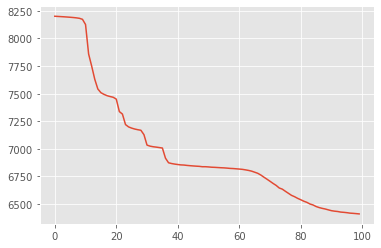

In [80]:
plt.plot(decrease_loss, linestyle = 'solid')
plt.show()

## Testing the accuracy of the model

1. The test data split from MNIST has been used to create a new test dataset
2. The trained model is used for prediciting the labels of the images and also sum of the (image label and random number)
3. The predictions are evaluated against the original labels in the test dataset. 
4. Individual accuracies for image and random number sum are calculated by diving the right predictions with total records in the dataset
5. Combined accuracy where both are correctly predicted is also calculated 


### Creating Test dataset

In [81]:
testData = MNISTAndRandomBinaryNumbers(val_set)
test_loader = torch.utils.data.DataLoader(testData
    ,batch_size=1000 
    ,shuffle=True
)

In [82]:
def get_num_correct2(preds1, labels1,preds2, labels2):
  a = preds1.argmax(dim=1).eq(labels1)
  b = preds2.argmax(dim=1).eq(labels2)
  c = torch.logical_and(a, b)
  return a.sum().item(),b.sum().item(), c.sum().item()

In [83]:
def accuracyCalculator(trainedModel, test_loader):
    images_correct=0
    random_sum_correct = 0
    total_loss=0
    with torch.no_grad():
      for images, labels,randomNumbers, sumlabels in test_loader:
        output1,output2 = network(images.to(device),randomNumbers.to(device))
        #images_correct += get_num_correct(output1.to(device), labels.to(device))
        #random_sum_correct += get_num_correct(output2.to(device), sumlabels.reshape(-1).to(device))#(sumlabels.reshape(batchSize)).type(torch.LongTensor).to(device))
        imgCount, sumCount, totalCount = get_num_correct2(output1.to(device), labels.to(device),output2.to(device), sumlabels.reshape(-1).to(device))
        images_correct += imgCount
        random_sum_correct +=sumCount
        total_loss += totalCount
    return images_correct,random_sum_correct,total_loss

In [84]:
imgAcc, randSumAcc, totalAcc = accuracyCalculator(network,test_loader)

In [85]:
imgAcc/10000,randSumAcc/10000,totalAcc/10000

(0.9835, 0.3897, 0.3875)

In [55]:
a = torch.randint(0,9,(4,))
a = a.reshape(-1,4)
a

tensor([[6, 8, 3, 7]])

In [56]:
a = a.reshape(-1)
a

tensor([6, 8, 3, 7])

In [57]:
a / a.sum(0).expand_as(a)

tensor([0.2500, 0.3333, 0.1250, 0.2917])

tensor([[1., 1., 1., 1.]])